# STEP 0. IMPORT LIBRARIES + DATA

In [1]:
# Importing necessary libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import os
import missingno as msno

from IPython.display import display #To display dataframe with a nice format.

# Setting display precision for pandas
pd.set_option("display.precision", 2)
# Set display option to show all columns
pd.set_option('display.max_columns', None)
# Set display option to show floating-point numbers in fixed decimal format
pd.set_option('display.float_format', lambda x: '{:.2f}'.format(x))



In [2]:
# ==================================================================================================
# READ DATA
# ==================================================================================================
import csv
# Define the file path for the Excel data
url_data = r"C:\Users\Olivi\OneDrive\Documents\OC_Formation_DATA_SCIENCE\PROJET3_Preparer_des_donnees_pour_un_organisme_de_sante_publique\DATA\merged_df.xlsx"

df_data = pd.read_excel(url_data)
df_data

,TARGET_main_category_fr,generic_name,nutrition_grade_fr,nutrition_score_fr_100g,saturated_fat_100g,sugars_100g,sodium_100g,salt_100g,carbohydrates_100g,fat_100g,proteins_100g,energy_100g,ingredients_text,ingredients_from_palm_oil_n,ingredients_that_may_be_from_palm_oil_n,brands,product_name,countries_fr,pnns_groups_2,categories_fr,code,quantity,TYPE_DATASET
0,Sirops,pur jus de tomates biologiques,c,0,0.73,10.71,0.05,0.14,10.80,1.53,0.67,222.21,"sirop saveur pistache 5 cl : sirop 99,16 % (su...",0,0,alice délice,sirops pour ganache macarons,france,unknown,"sirops,sirops-pour-ganache",10127735,200 ml,BEVERAGE
1,Sodas,boisson gazeuse rafraîchissante aux extraits n...,e,13,0.00,10.40,0.01,0.03,10.40,0.00,0.00,177.00,"eau gazéifiée, sucre, colorant caramel e150d, ...",0,0,pepsi,"pepsi, nouveau goût !",france,sweetened beverages,"boissons,boissons gazeuses,sodas,sodas au cola...",40608754,150 ml,BEVERAGE
2,Sodas aux fruits,boisson gazeuse aux extraits naturels de citro...,e,13,0.00,10.40,0.04,0.10,10.40,0.00,0.00,177.00,"eau gazéifiée, sucre, acidifiants (acide citri...",0,0,"7up,pepsico",7up,france,sweetened beverages,"aliments et boissons à base de végétaux,boisso...",87177756,330 ml,BEVERAGE
3,Sodas,cidre breton bio doux,d,0,0.73,10.71,0.05,0.14,10.80,1.53,0.67,222.21,"eau, arôme fleur d'oranger, conservateur : e20...",0,0,pepsi,pepsi,france,sweetened beverages,"boissons,boissons gazeuses,sodas,boissons sucrées",886100252,330 ml,BEVERAGE
4,Sodas aux fruits,ginger beer,c,0,0.73,10.71,0.05,0.14,10.80,1.53,0.67,222.21,sparkling filtered water (sweetened by a blend...,0,0,reed's,extra ginger beer reed's,états-unis,sweetened beverages,"aliments et boissons à base de végétaux,boisso...",8274000078,354 ml,BEVERAGE
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
81683,Produits d'élevages,miel,d,0,5.82,13.28,0.48,1.20,29.33,14.71,8.16,1163.71,miel,0,0,l. boulaire,miel de camargue,france,sweets,"produits à tartiner,petit-déjeuners,produits à...",9900010011557,250 g,SOLID_FOOD
81684,pl:Szprot,sprot,c,0,5.82,13.28,0.48,1.20,29.33,14.71,8.16,1163.71,"joghurt mild mit 3,5% fett im milchanteil. her...",0,0,evrafish,szprot w oleju roslinnym,pologne,unknown,pl:szprot,9908278636246,170 g,SOLID_FOOD
81685,Thés verts,thé bio équitable,c,2,0.20,0.50,0.01,0.03,0.50,0.20,0.50,21.00,"thé vert, arôme naturel bergamote avec autres ...",0,0,lobodis,thé vert earl grey,france,non-sugared beverages,"aliments et boissons à base de végétaux,boisso...",99111250,50 g,SOLID_FOOD
81686,Produits à tartiner salés,rollitos de primavera y salsa agridulce. produ...,d,0,5.82,13.28,0.48,1.20,29.33,14.71,8.16,1163.71,"viande d'oie, graisse de canard, épices, sel, ...",0,0,"sans marque,d.lambert",rillette d'oie,france,processed meat,"viandes,produits à tartiner,charcuteries,produ...",9935010000003,180 g,SOLID_FOOD


# STEP 1. Analyse Univariée
1. Pour l'analyse univariée, utilisez des visualisations appropriées telles que des histogrammes, des diagrammes en boîte (boxplots) 
ou des graphiques de densité pour comprendre la distribution des valeurs dans chaque feature.

In [3]:
# Numeric features
numeric_features = ['nutrition_score_fr_100g', 'saturated_fat_100g', 'sugars_100g', 'sodium_100g', 'salt_100g', 'carbohydrates_100g', 'fat_100g', 'proteins_100g', 'energy_100g', 'ingredients_from_palm_oil_n', 'ingredients_that_may_be_from_palm_oil_n']

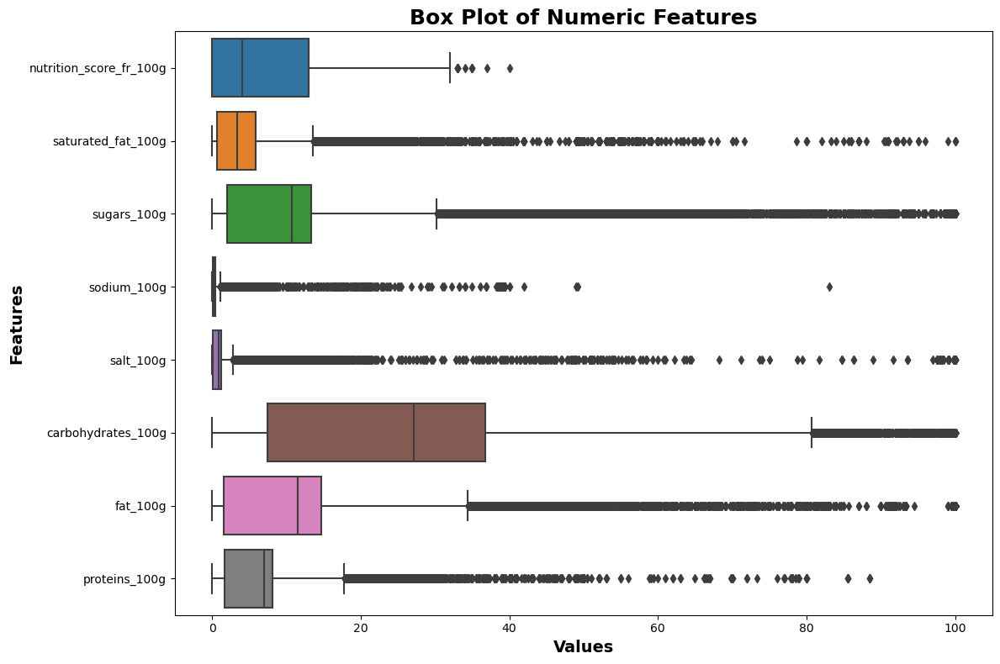

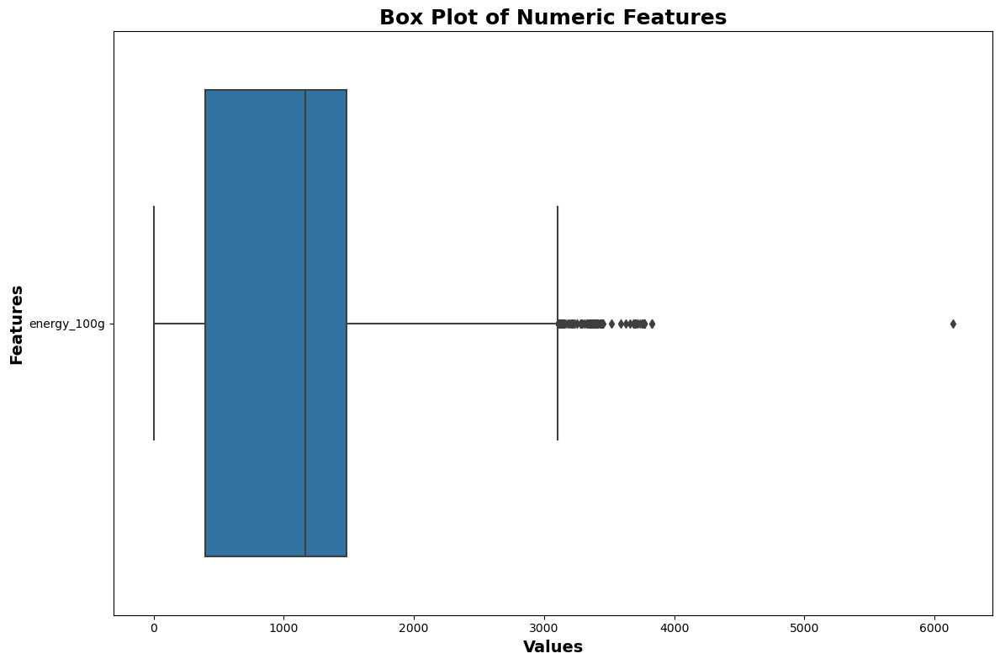

In [4]:
# ==================================================================================================
# BOXPLOTS
# ==================================================================================================
def plot_boxplot(features):
    """
    Function to plot box plots for numeric features.

    Parameters:
    - features: list of numeric feature names to plot box plots for
    """
    plt.figure(figsize=(12, 8))
    
    # Create box plot for each feature
    sns.boxplot(data=df_data[features], orient="h")
    
    # Adjust title fontsize and style
    plt.title("Box Plot of Numeric Features", fontsize=18, fontweight='bold')
    
    # Adjust axis titles fontsize and style
    plt.xlabel("Values", fontsize=14, fontweight='bold')
    plt.ylabel("Features", fontsize=14, fontweight='bold')
    
    plt.tight_layout()
    plt.show()

# Define lists of numeric features
numeric_features_without_energy   = ['nutrition_score_fr_100g', 'saturated_fat_100g', 'sugars_100g', 'sodium_100g', 'salt_100g', 'carbohydrates_100g', 'fat_100g', 'proteins_100g']
numeric_features_with_ONLY_energy = ['energy_100g']
numeric_features_with_palm_oil    = ['ingredients_from_palm_oil_n', 'ingredients_that_may_be_from_palm_oil_n']

# Perform box plot analysis for numeric features
plot_boxplot(numeric_features_without_energy)
plot_boxplot(numeric_features_with_ONLY_energy)


In [5]:
# # ==================================================================================================
# # VIOLIN PLOT
# # ==================================================================================================
# def plot_violin(features):
#     plt.figure(figsize=(12, 8))
    
#     # Create violin plot with horizontal orientation
#     sns.violinplot(data=df_data[features], orient="h", scale="count", linewidth=1.5, inner_kws=dict(box_width=15, whis_width=2, color=".8"))
    
#     plt.title("Violin Plot of Numeric Features")
#     plt.xlabel("Density")
#     plt.ylabel("Features")
#     plt.tight_layout()
#     plt.show()

# numeric_features_without_energy   = ['nutrition_score_fr_100g', 'saturated_fat_100g', 'sugars_100g', 'sodium_100g', 'salt_100g', 'carbohydrates_100g', 'fat_100g', 'proteins_100g']
# numeric_features_with_ONLY_energy = ['energy_100g']
# numeric_features_with_palm_oil    = ['ingredients_from_palm_oil_n', 'ingredients_that_may_be_from_palm_oil_n']

# # Perform univariate analysis for numeric features using a single violin plot
# plot_violin(numeric_features_without_energy)
# plot_violin(numeric_features_with_ONLY_energy)
# plot_violin(numeric_features_with_palm_oil)

C:\Users\Olivi\AppData\Local\Temp\ipykernel_3988\1110908345.py:19: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df[feature], shade=True, label=feature)
D:\ANACONDA\envs\OC_PROJET2\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\Olivi\AppData\Local\Temp\ipykernel_3988\1110908345.py:19: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df[feature], shade=True, label=feature)
D:\ANACONDA\envs\OC_PROJET2\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf va

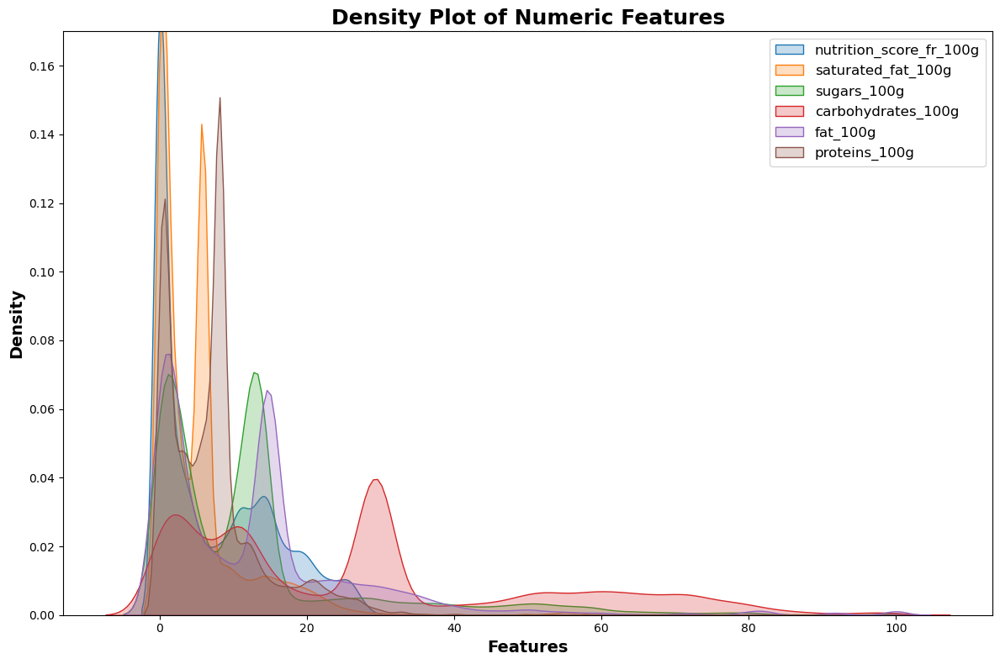

C:\Users\Olivi\AppData\Local\Temp\ipykernel_3988\1110908345.py:19: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df[feature], shade=True, label=feature)
D:\ANACONDA\envs\OC_PROJET2\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\Olivi\AppData\Local\Temp\ipykernel_3988\1110908345.py:19: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df[feature], shade=True, label=feature)
D:\ANACONDA\envs\OC_PROJET2\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf va

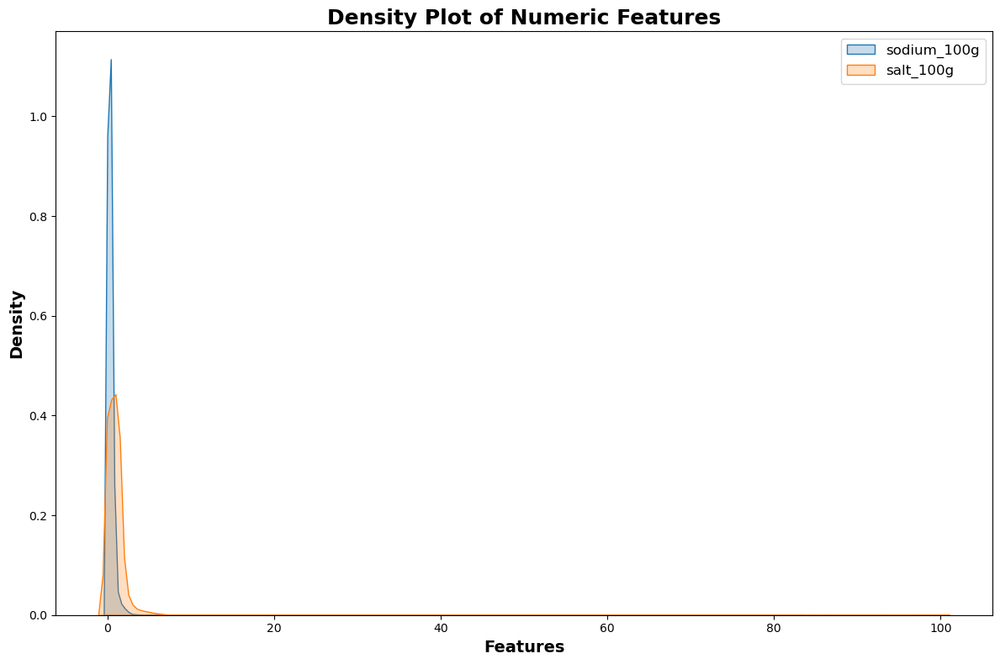

C:\Users\Olivi\AppData\Local\Temp\ipykernel_3988\1110908345.py:19: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df[feature], shade=True, label=feature)
D:\ANACONDA\envs\OC_PROJET2\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


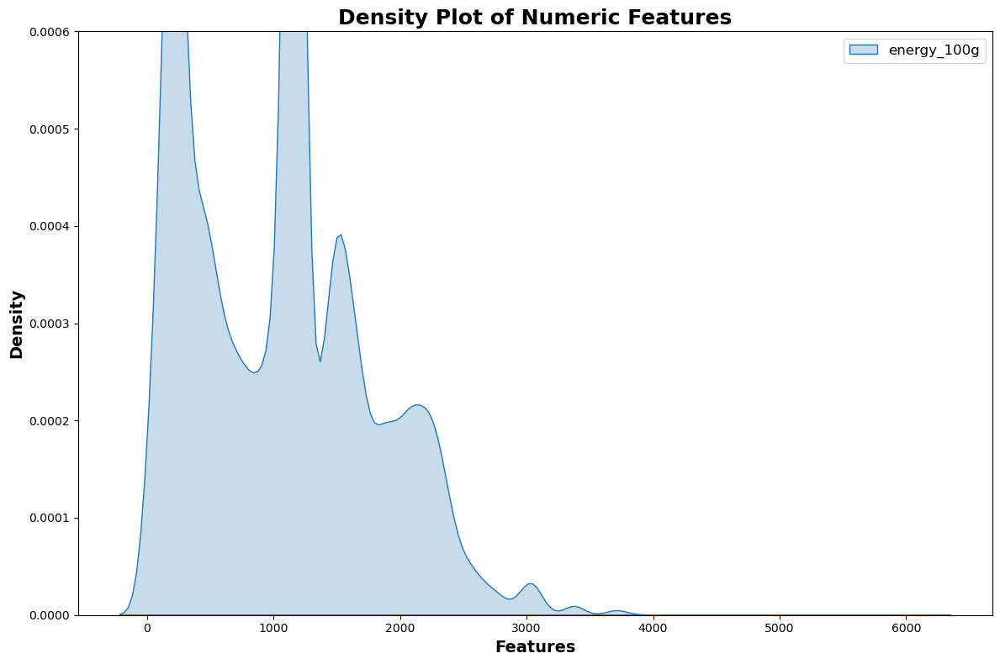

C:\Users\Olivi\AppData\Local\Temp\ipykernel_3988\1110908345.py:19: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df[feature], shade=True, label=feature)
D:\ANACONDA\envs\OC_PROJET2\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\Olivi\AppData\Local\Temp\ipykernel_3988\1110908345.py:19: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df[feature], shade=True, label=feature)
D:\ANACONDA\envs\OC_PROJET2\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf va

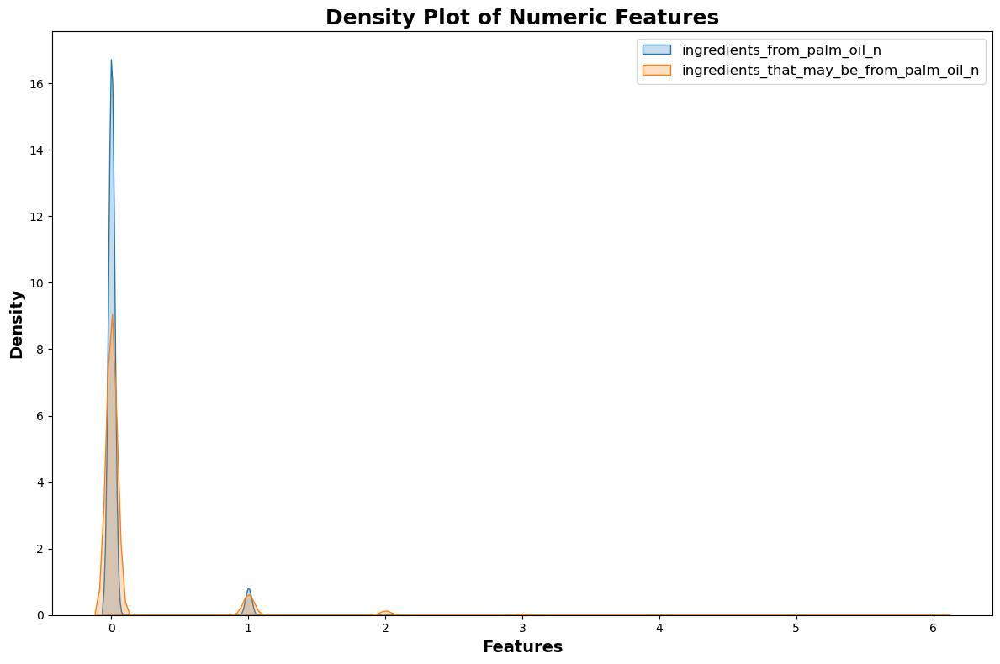

In [6]:
# ==================================================================================================
# Calculate DENSITY PLOT
# ==================================================================================================

def plot_density(df, features, ylim):
    """
    Function to plot density plots for numeric features.

    Parameters:
    - df: DataFrame containing the data
    - features: list of numeric feature names to plot density plots for
    - ylim: list containing y-axis limits [lower_limit, upper_limit]
    """
    
    plt.figure(figsize=(12, 8))
    
    # Plot density plot for each feature
    for feature in features:
        sns.kdeplot(df[feature], shade=True, label=feature)
        
    # Adjusted title, axis titles, and legend
    plt.title("Density Plot of Numeric Features", fontsize=18, fontweight='bold')
    plt.xlabel("Features", fontsize=14, fontweight='bold')
    plt.ylabel("Density", fontsize=14, fontweight='bold')
    plt.legend(fontsize=12)
    
    # Adjust y-axis limits
    plt.ylim(ylim[0], ylim[1])  # Adjust these limits as needed
    
    plt.tight_layout()
    plt.show()

# Define lists of numeric features
numeric_features_V1 = ['nutrition_score_fr_100g', 'saturated_fat_100g', 'sugars_100g', 'carbohydrates_100g', 'fat_100g', 'proteins_100g']
numeric_features_V2   = ['sodium_100g', 'salt_100g']
numeric_features_with_ONLY_energy = ['energy_100g']
numeric_features_with_palm_oil    = ['ingredients_from_palm_oil_n', 'ingredients_that_may_be_from_palm_oil_n']

# Perform univariate analysis for numeric features using density plots
plot_density(df_data, numeric_features_V1, [0, 0.17])
plot_density(df_data, numeric_features_V2, [0, None])
plot_density(df_data, numeric_features_with_ONLY_energy, [0, 0.0006])
plot_density(df_data, numeric_features_with_palm_oil, [None, None])

# STEP 2. Analyse Bivariée
1. Pour l'analyse bivariée, utilisez des graphiques de dispersion (scatterplots), des matrices de corrélation ou des diagrammes de violon pour étudier les relations entre les paires de features.
2. Calculez les statistiques descriptives pour obtenir des informations supplémentaires sur la tendance centrale, la dispersion et la forme des distributions.

## II.1. SCATTER PLOT 

In [7]:
import seaborn as sns
import matplotlib.pyplot as plt


def plot_outlier_scatter(df, current_indicator, y_axis_name):
    """
    Function to plot a scatterplot with enhanced features.

    Parameters:
    - df: DataFrame containing the data
    - current_indicator: name of the feature for x-axis
    - y_axis_name: name of the feature for y-axis
    """
    # Scatterplot with enhanced features
    plt.figure(figsize=(12, 8))  
    
    # Scatterplot with transparency and outlier highlight
    sns.scatterplot(x=current_indicator, y=y_axis_name, data=df, alpha=0.6)
    
    # Regression line
    # sns.regplot(x=current_indicator, y='nutrition-score-fr_100g', data=df, scatter=False, color='green', label='Regression line')
    
    # Title with increased font size and bold
    plt.title(f'Scatterplot: {current_indicator} vs. {y_axis_name}', fontsize=18, fontweight='bold')
    
    # Axis labels with increased font size and bold
    plt.xlabel(f'{current_indicator} (g/100g)', fontsize=14, fontweight='bold')
    plt.ylabel(y_axis_name, fontsize=14, fontweight='bold')
    
    # Legend if needed
    plt.legend()
    
    # Grid
    plt.grid(True)
    plt.show()


### II.1.1. SCATTER PLOT: 'nutrition-score-fr_100g' vs ALL

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


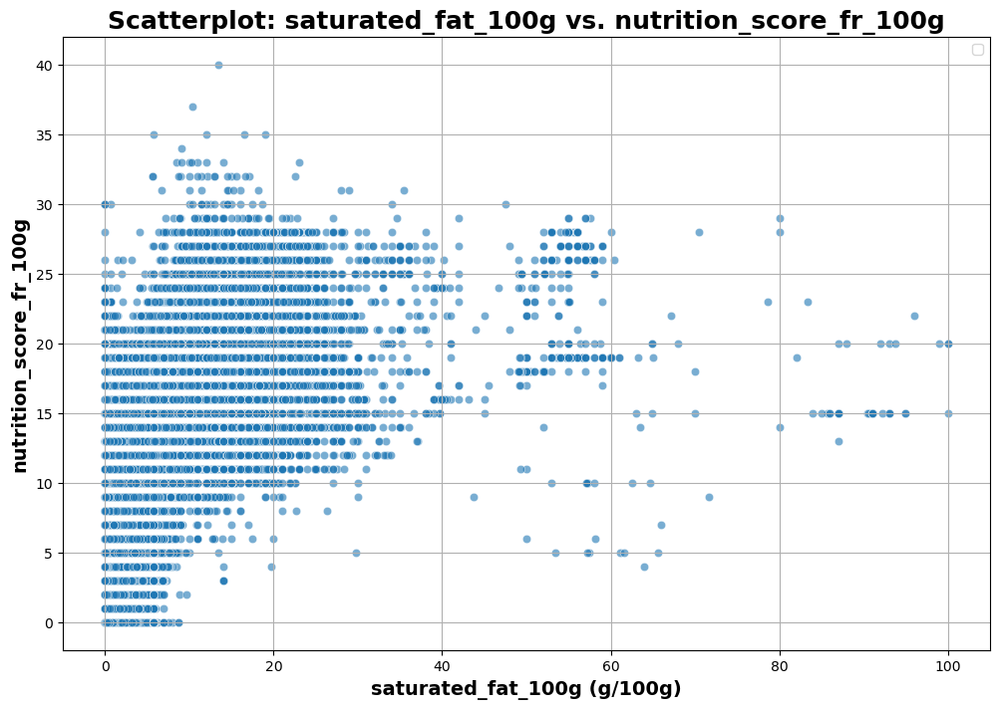

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


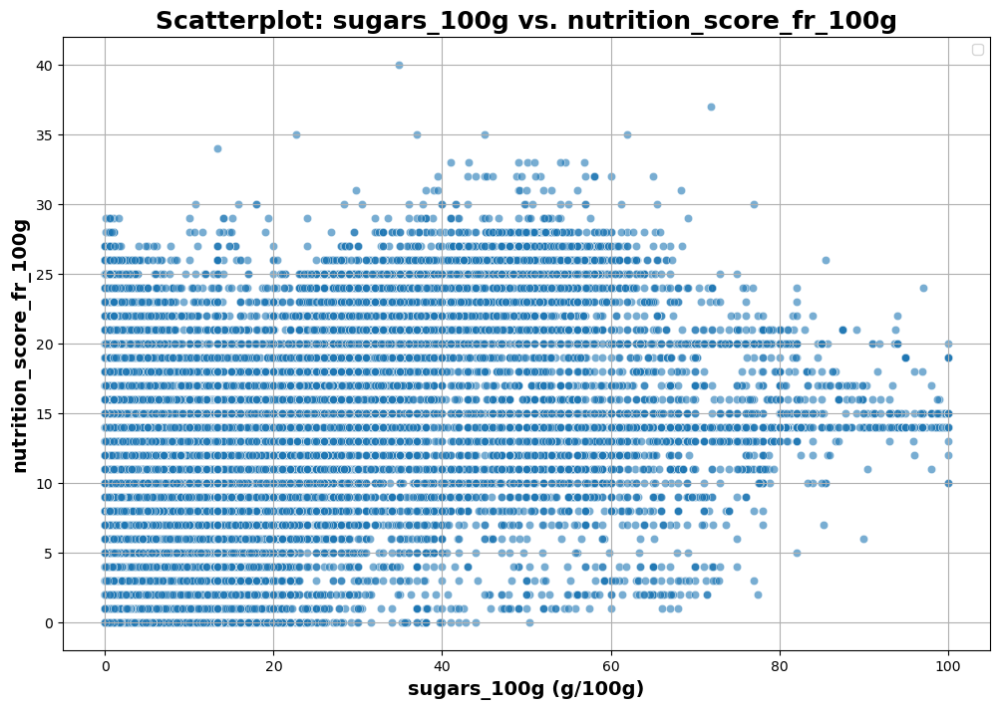

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


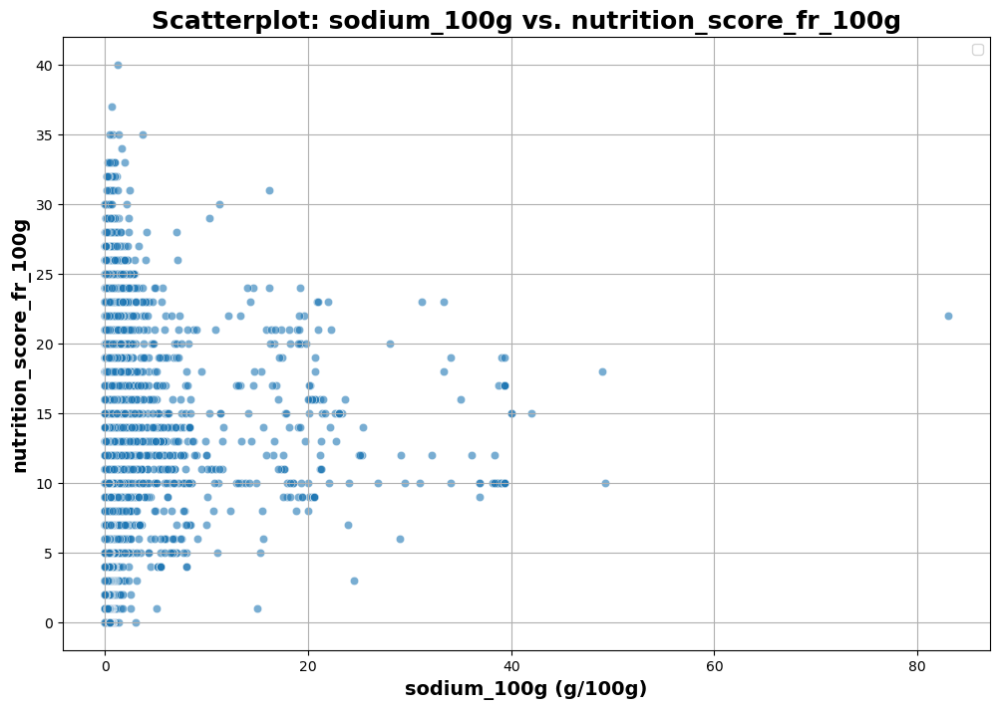

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


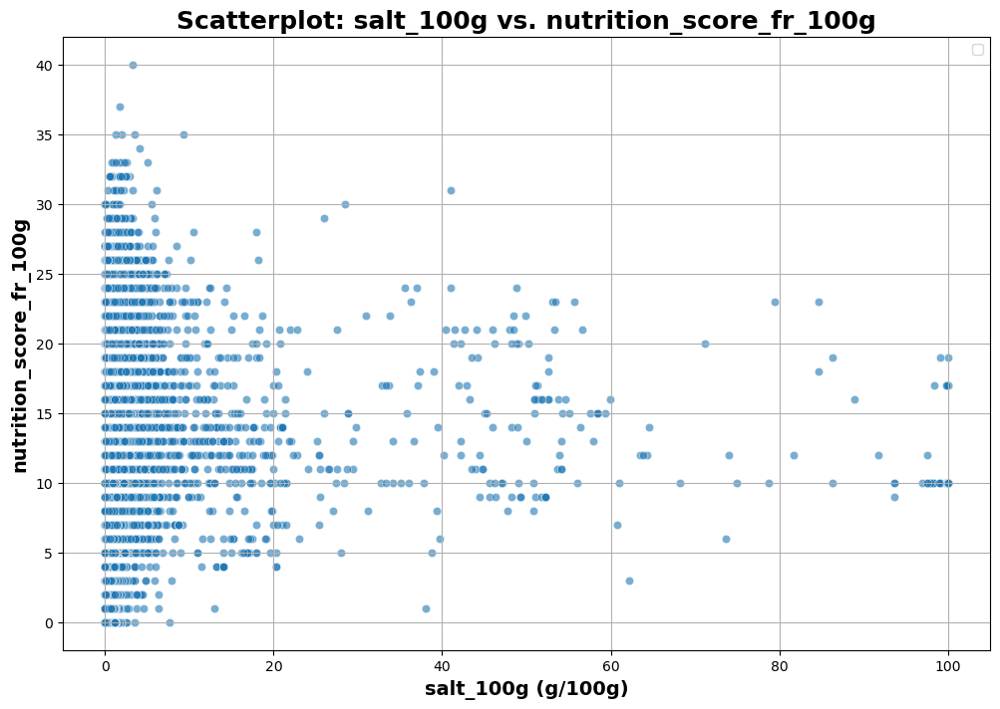

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


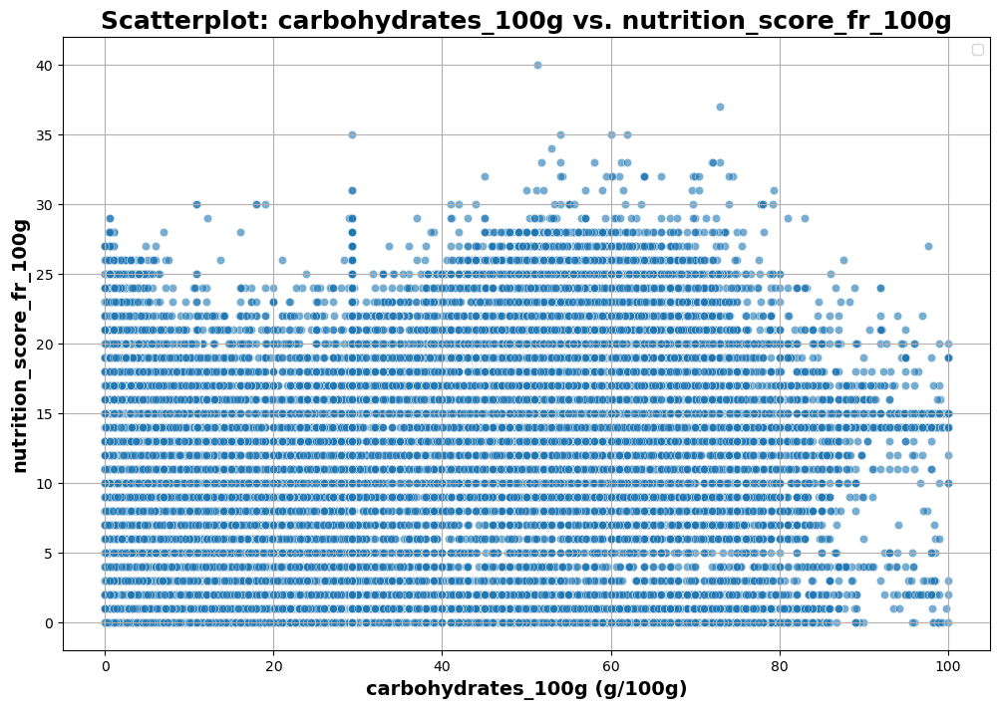

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


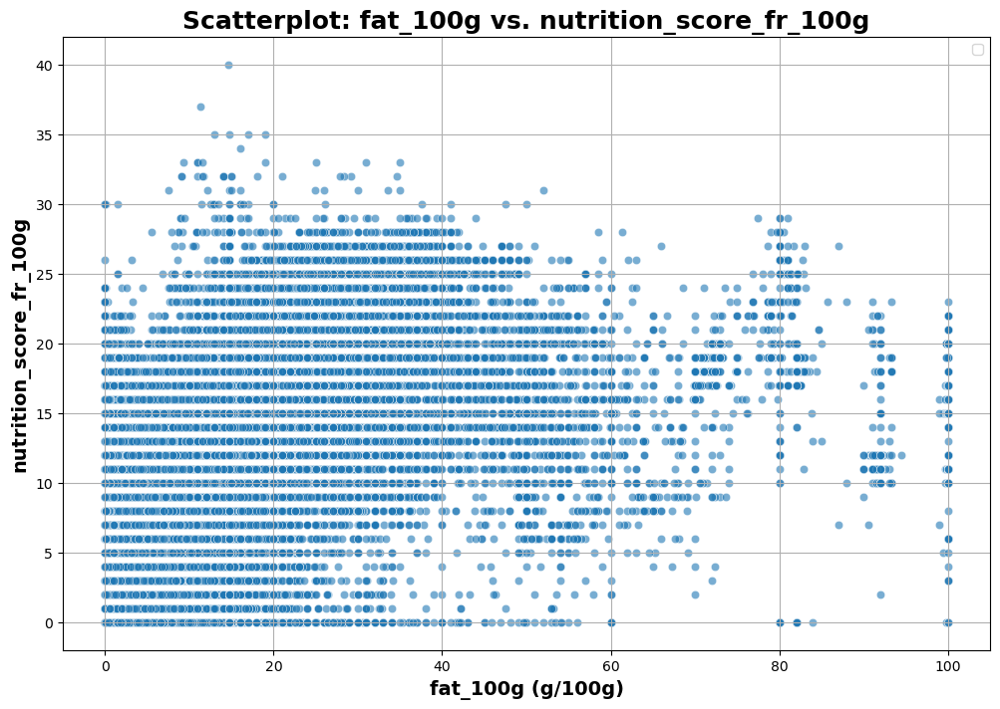

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


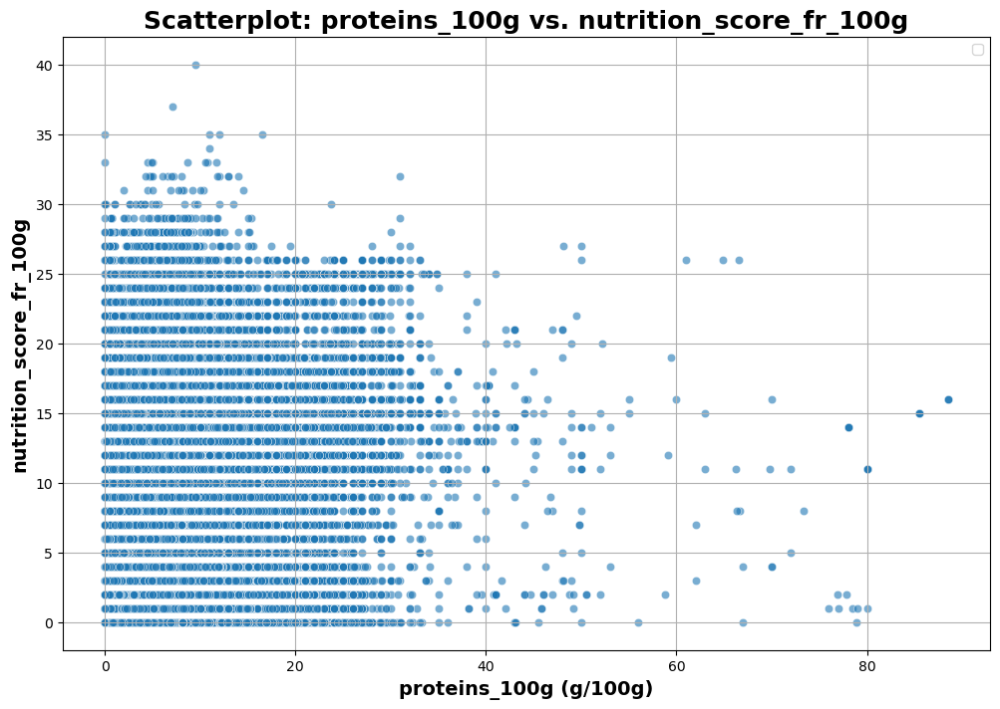

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


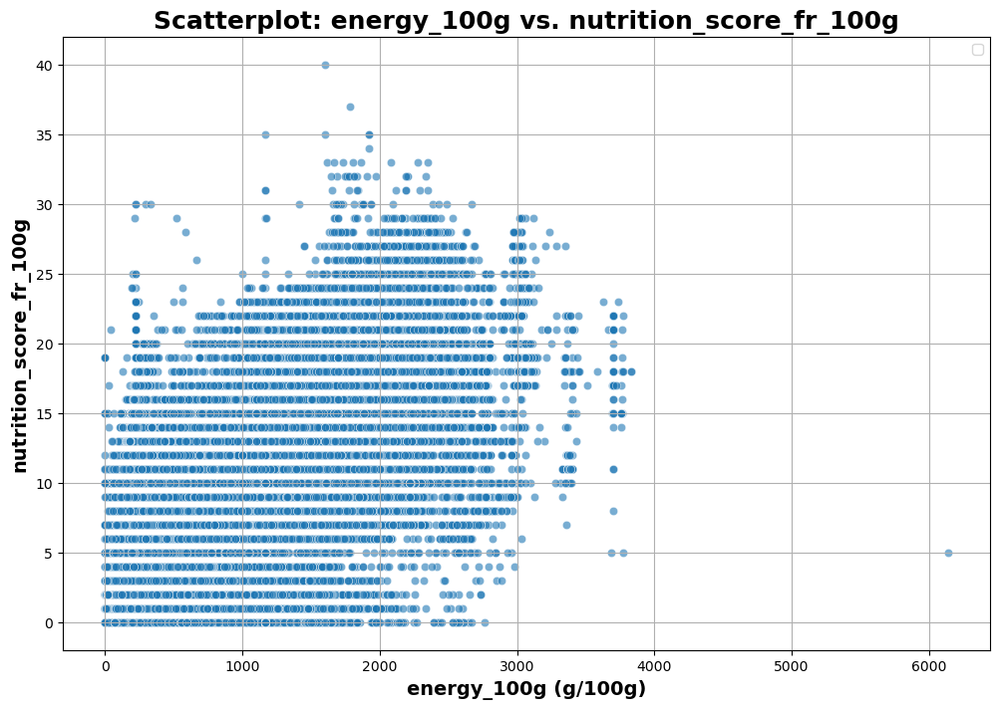

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


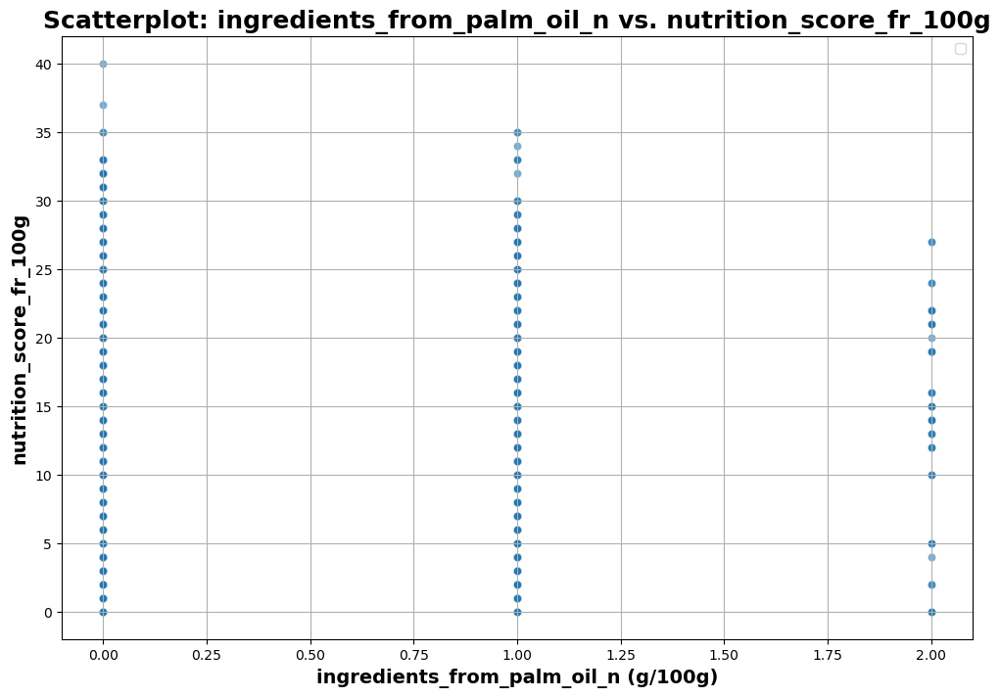

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


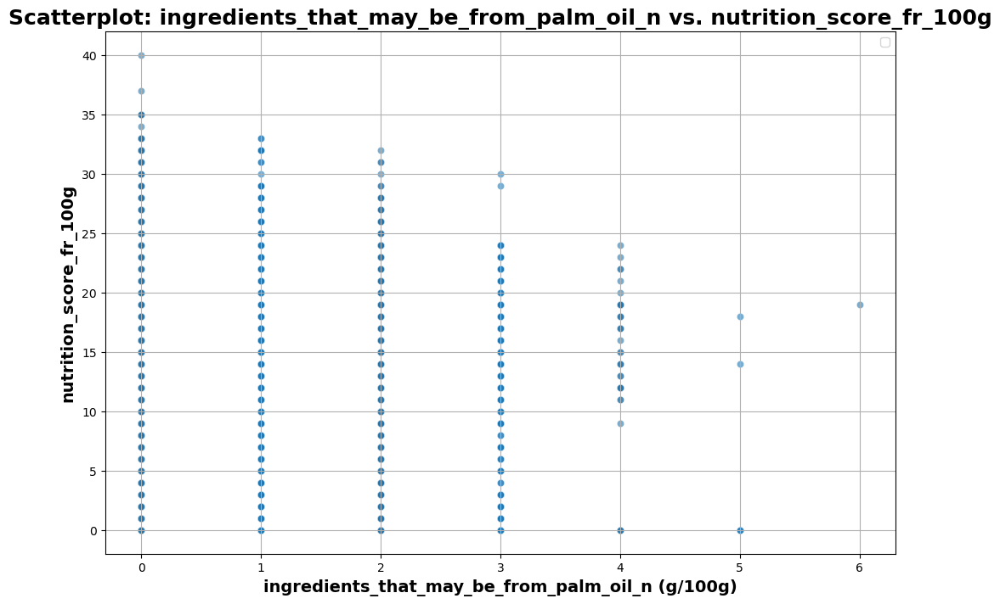

In [8]:
# ==================================================================================================
# SCATTER PLOT : 'nutrition-score-fr_100g' vs ALL
# ==================================================================================================
numeric_features = ['saturated_fat_100g', 'sugars_100g', 'sodium_100g', 'salt_100g', 'carbohydrates_100g', 'fat_100g', 'proteins_100g', 'energy_100g', 'ingredients_from_palm_oil_n', 'ingredients_that_may_be_from_palm_oil_n']
for indicator in numeric_features:
    plot_outlier_scatter(df_data, indicator, 'nutrition_score_fr_100g')

### II.1.2. SCATTER PLOT: 'sugars_100g' vs ALL

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


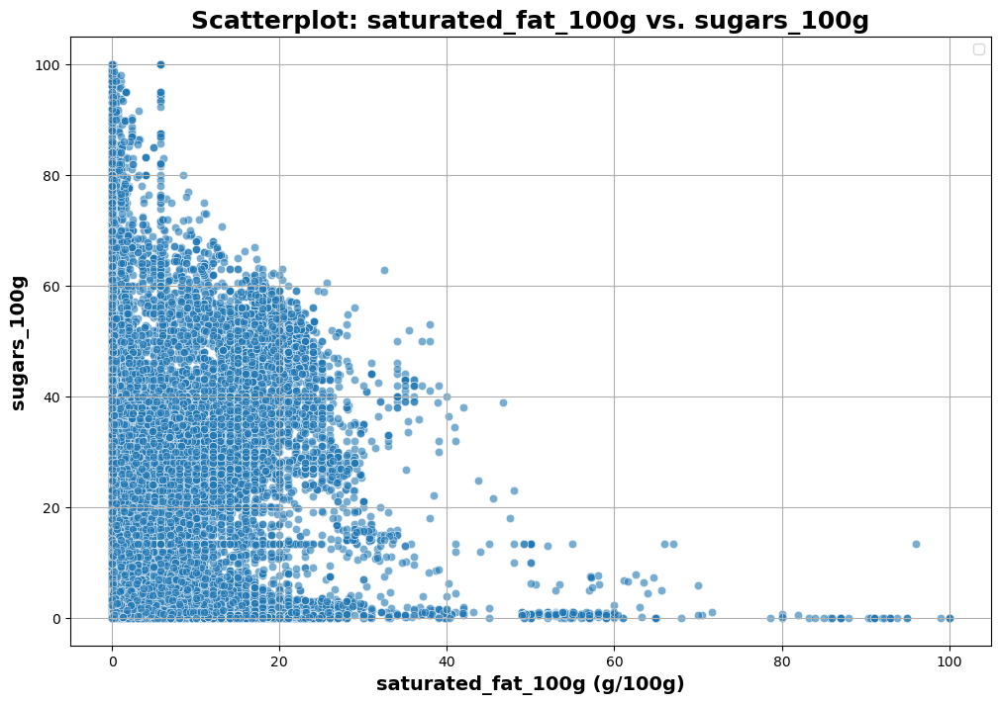

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


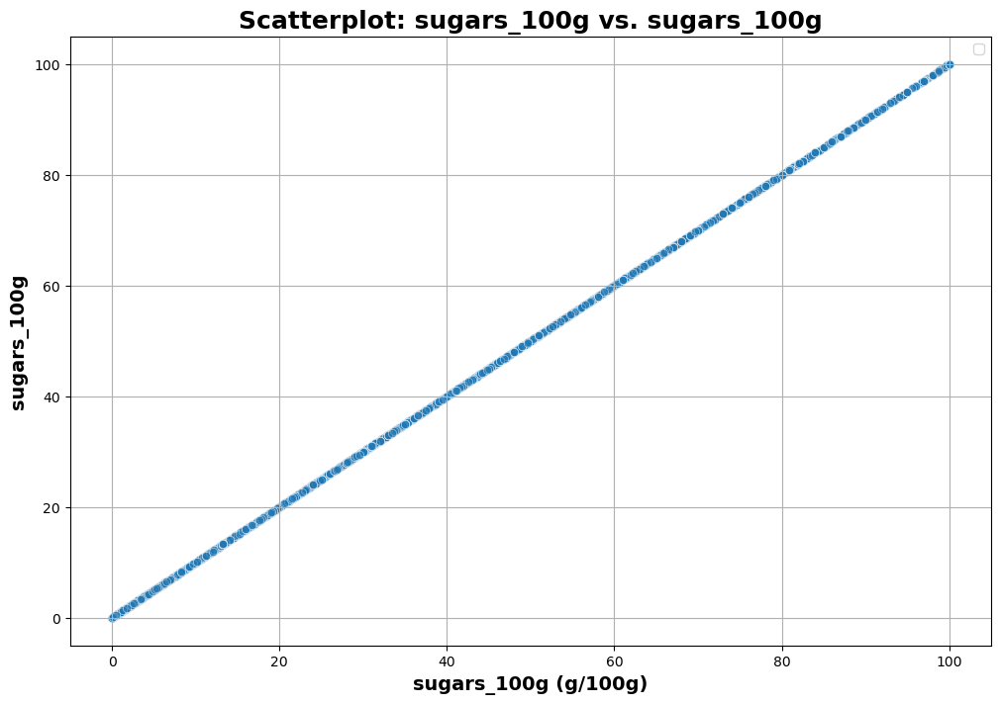

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


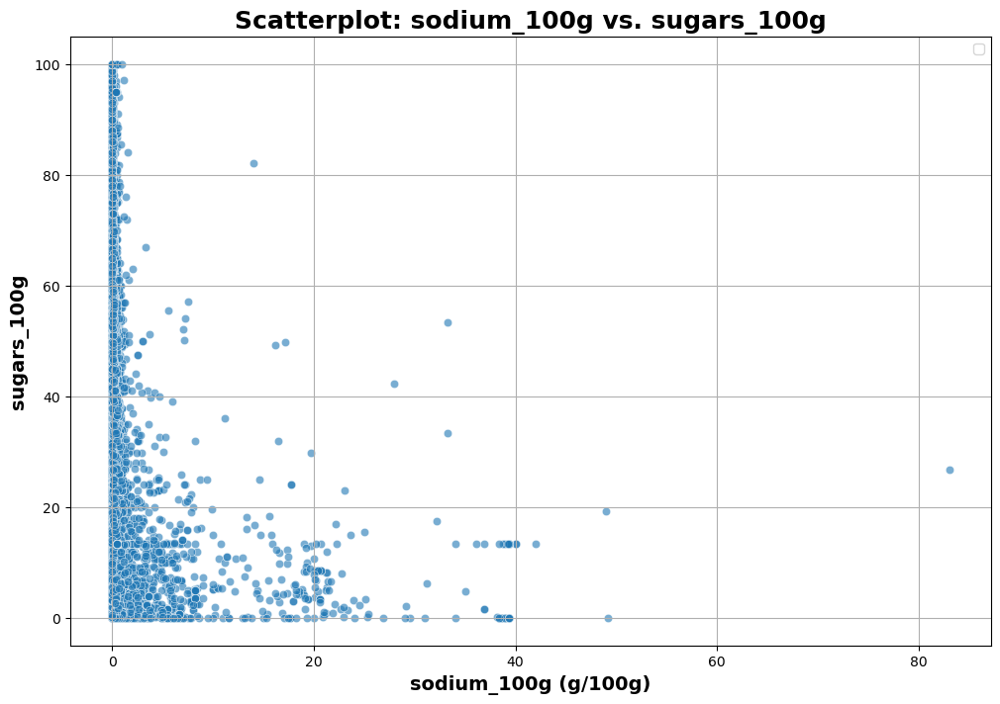

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


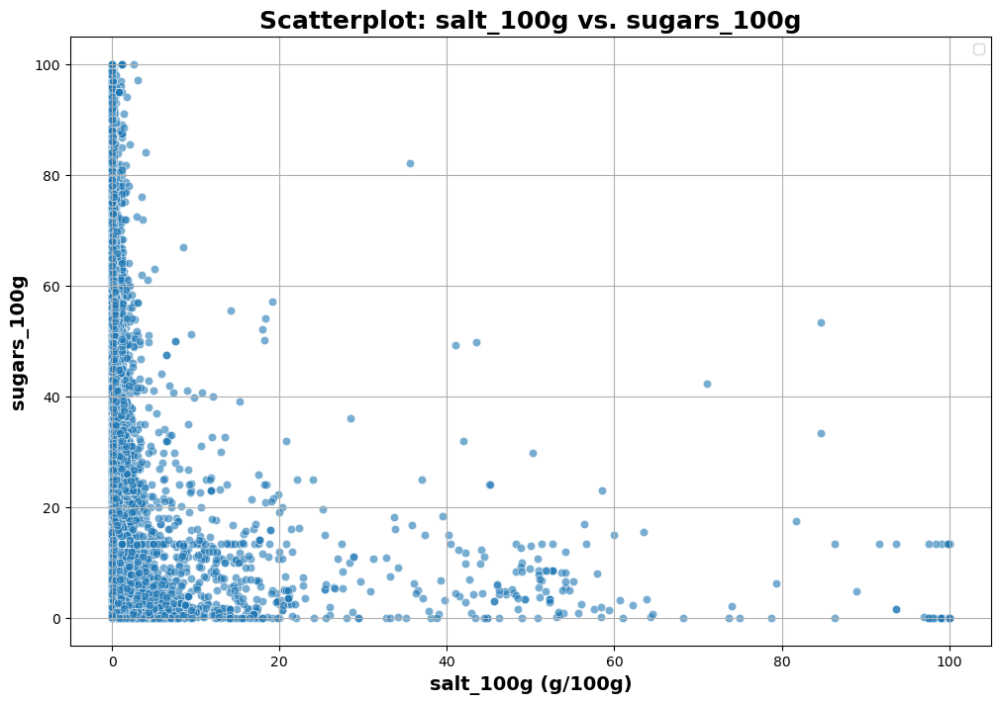

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


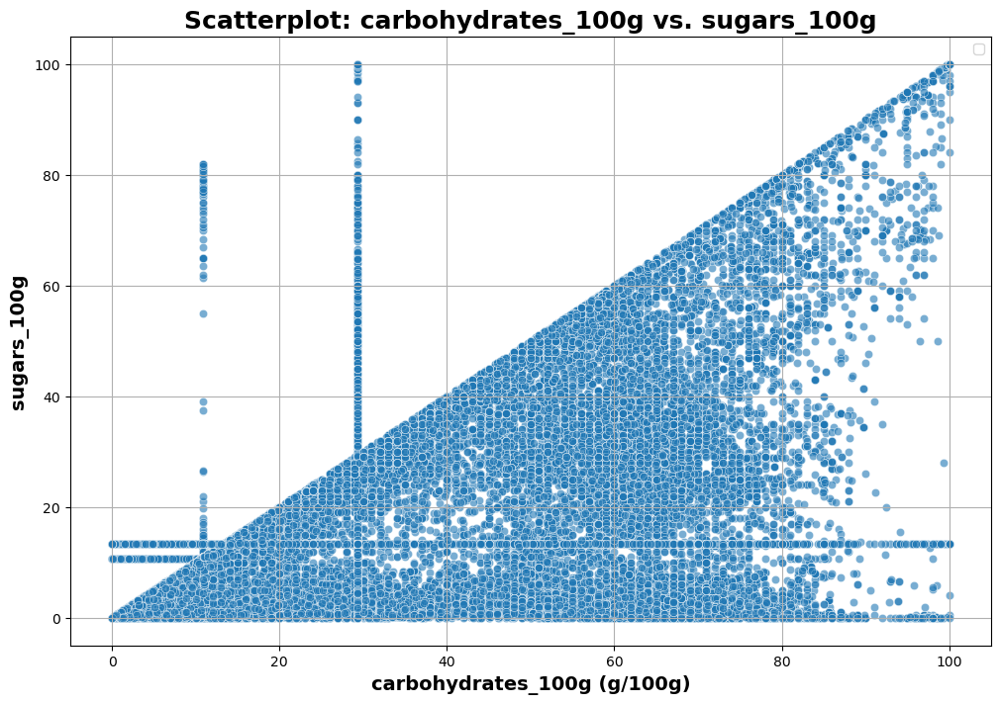

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


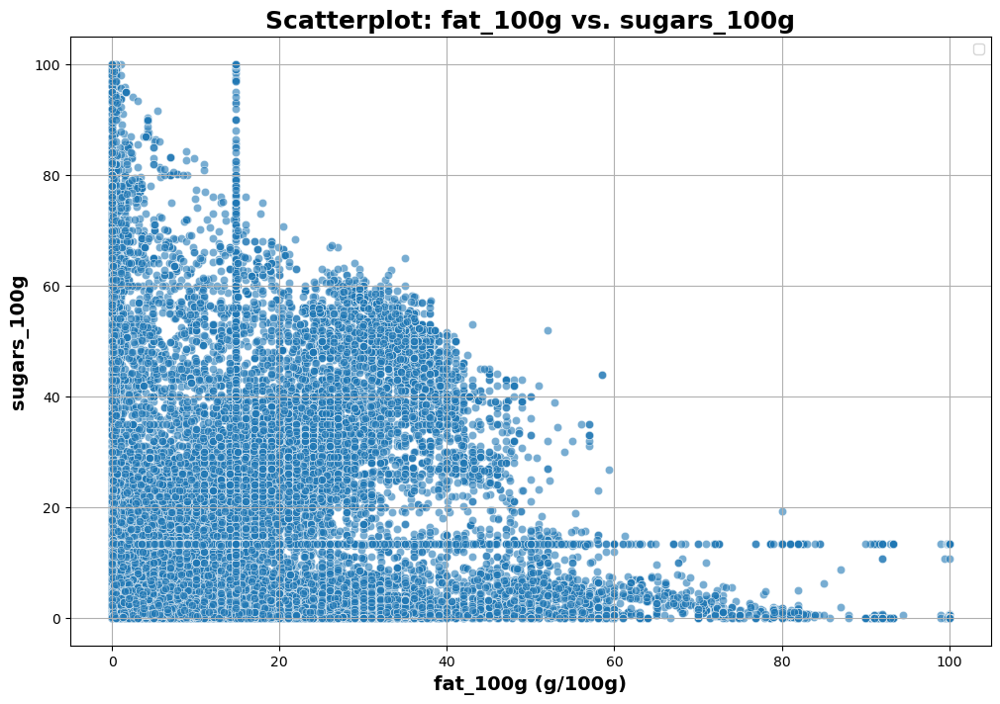

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


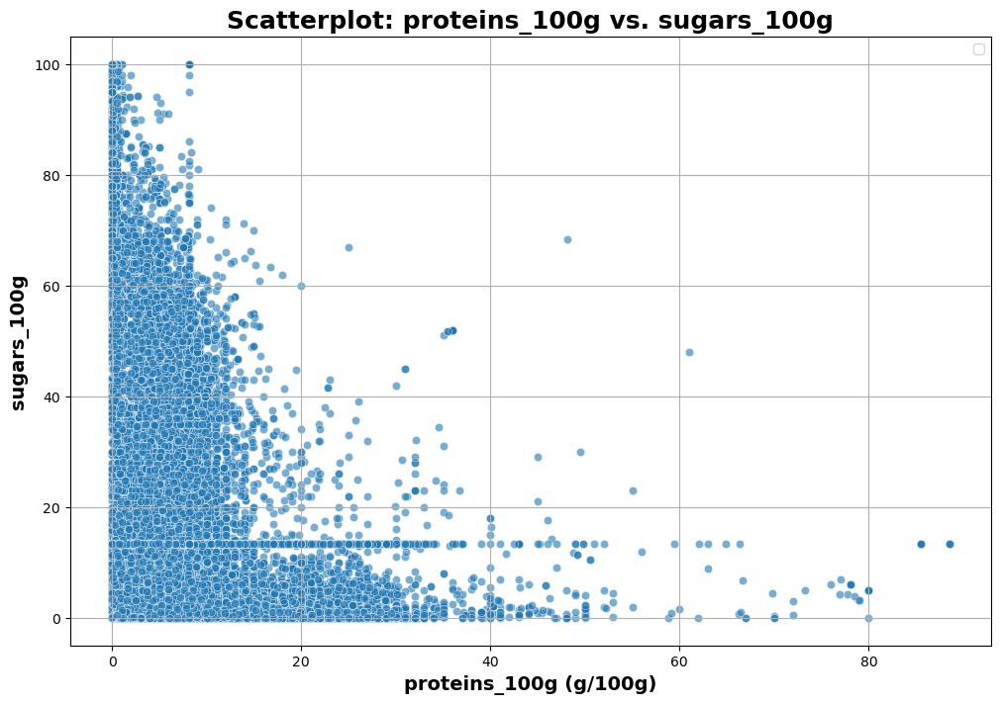

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


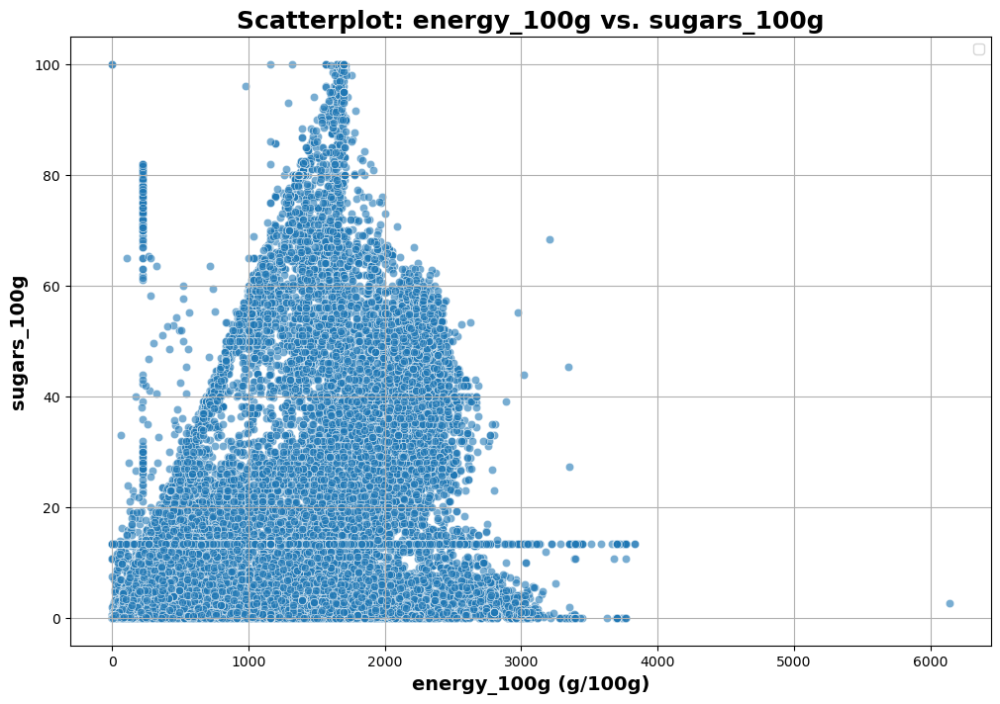

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


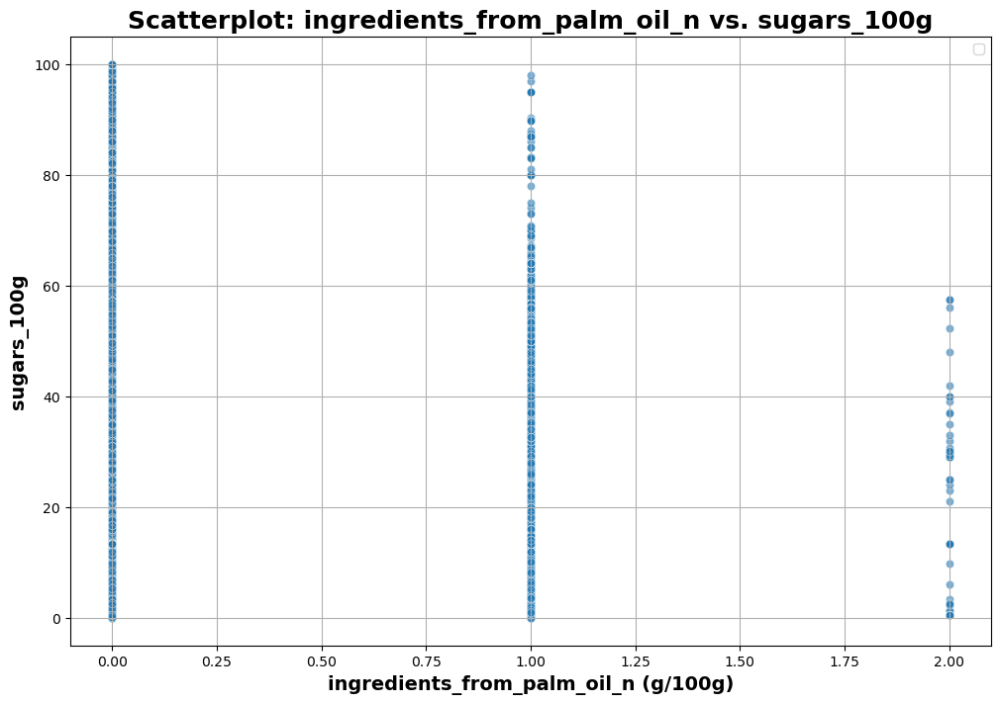

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


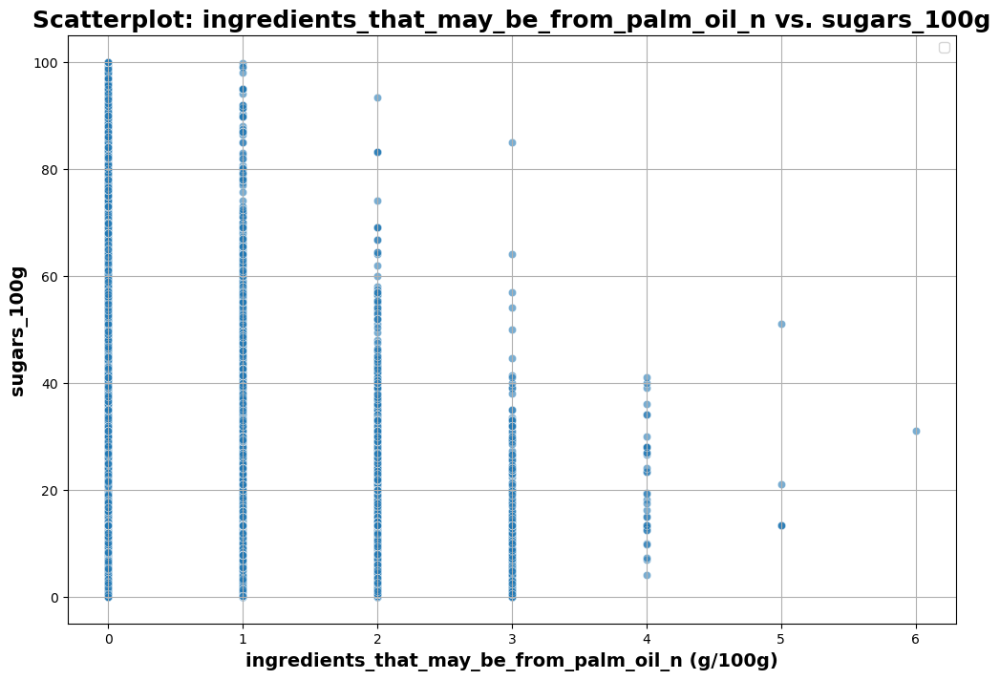

In [9]:
# ==================================================================================================
# SCATTER PLOT : 'sugars_100gg' vs ALL
# ==================================================================================================
numeric_features = ['saturated_fat_100g', 'sugars_100g', 'sodium_100g', 'salt_100g', 'carbohydrates_100g', 'fat_100g', 'proteins_100g', 'energy_100g', 'ingredients_from_palm_oil_n', 'ingredients_that_may_be_from_palm_oil_n']
for indicator in numeric_features:
    plot_outlier_scatter(df_data, indicator, 'sugars_100g')

### II.1.3. SCATTER PLOT: 'energy_100g' vs ALL

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


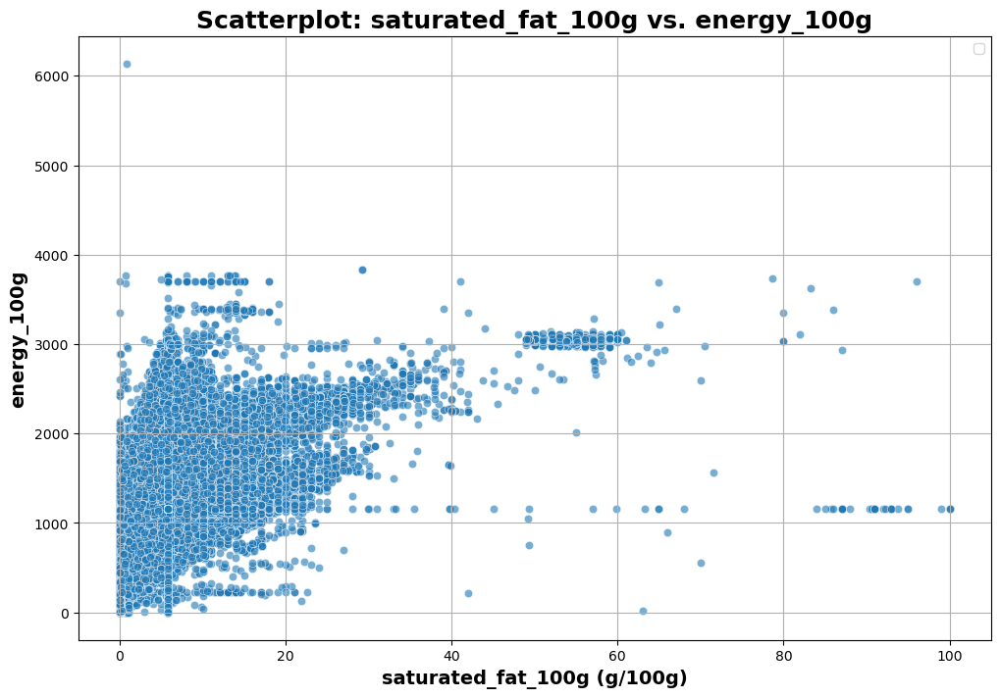

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


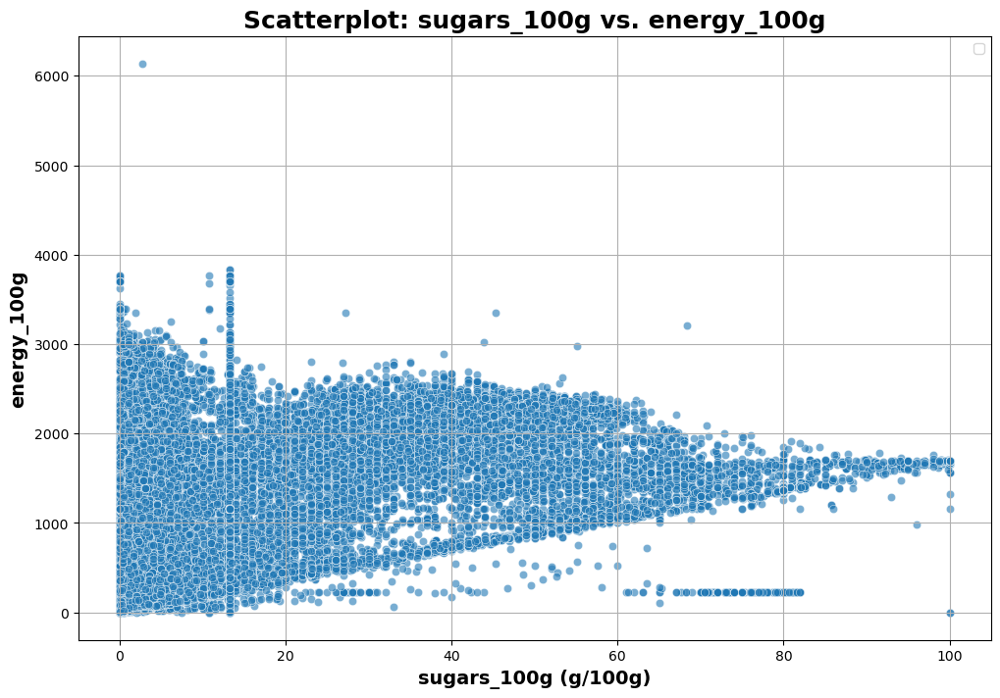

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


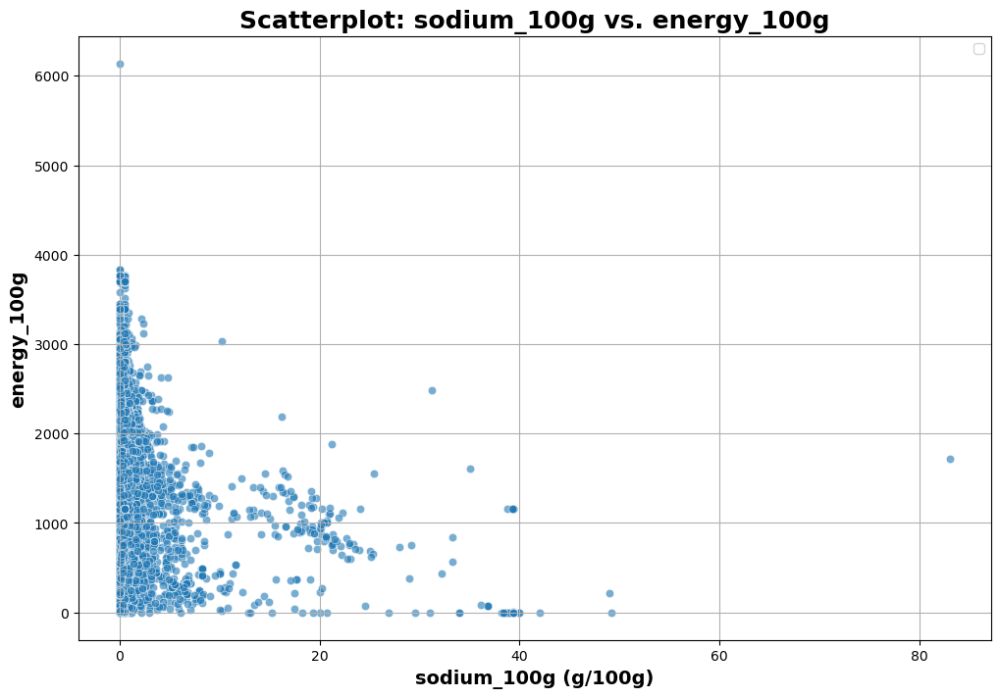

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


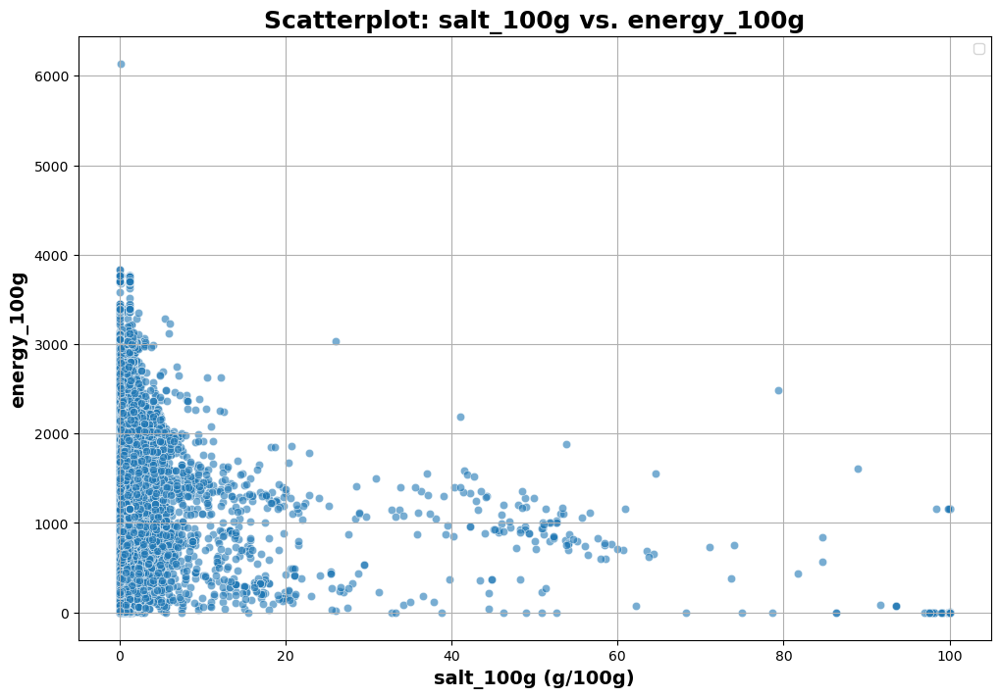

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


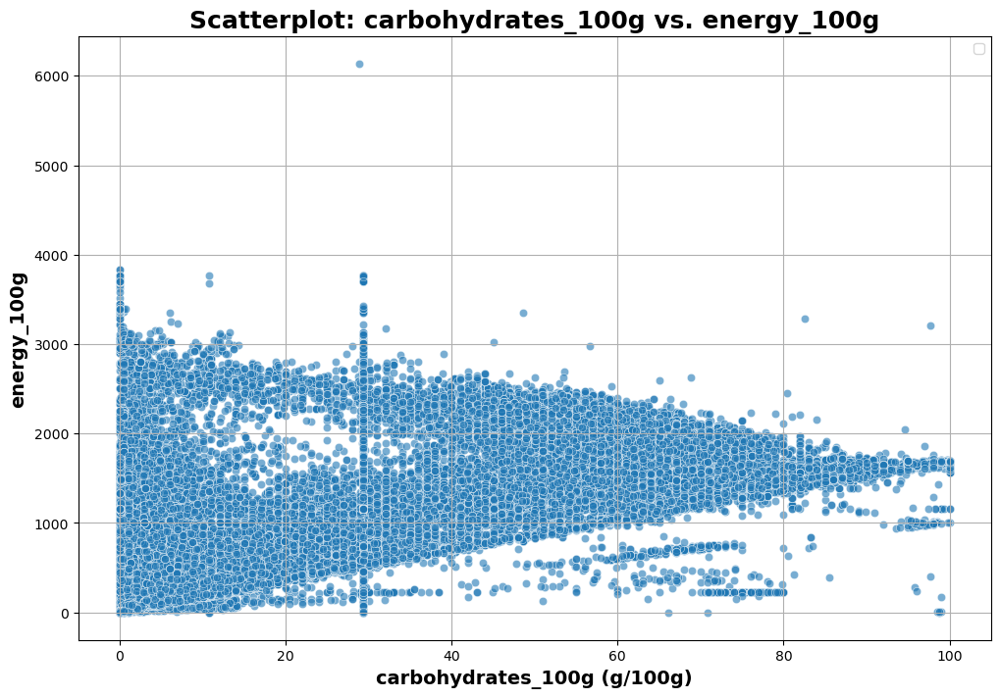

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


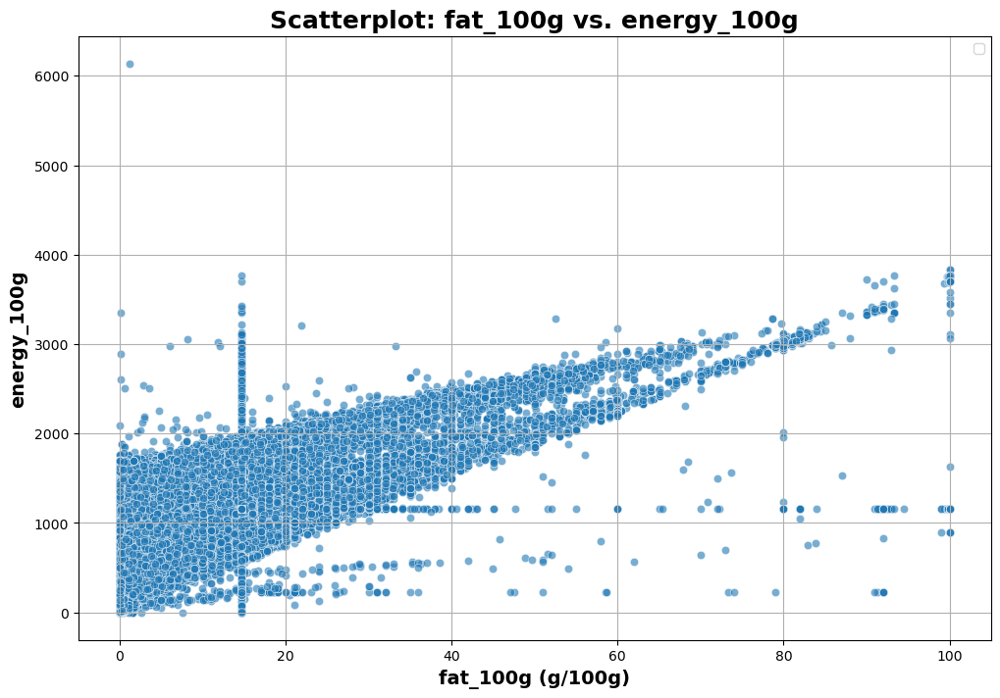

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


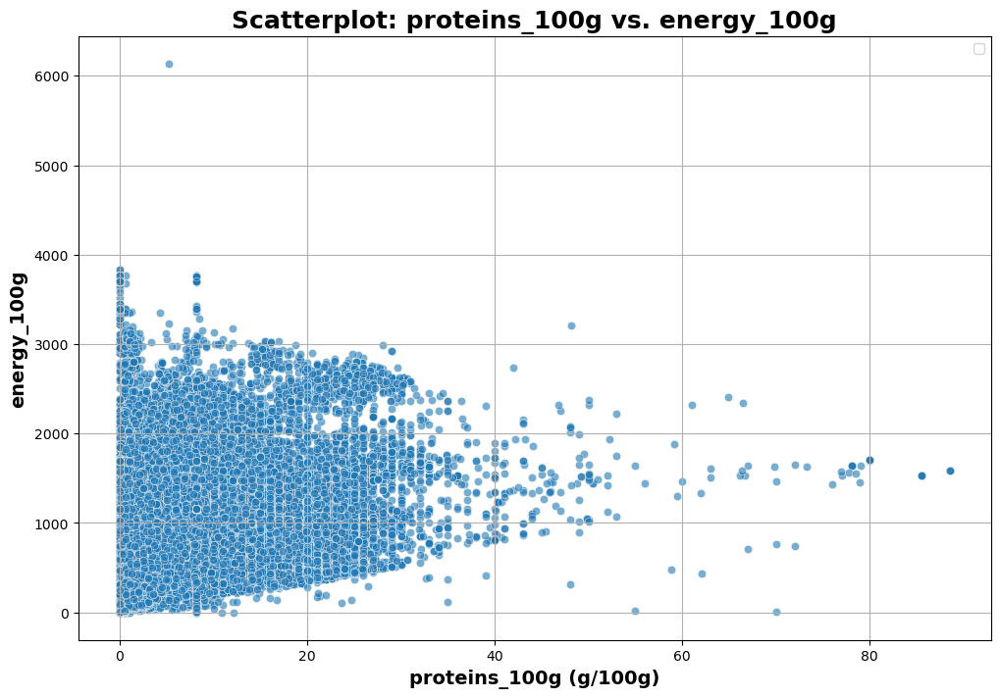

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


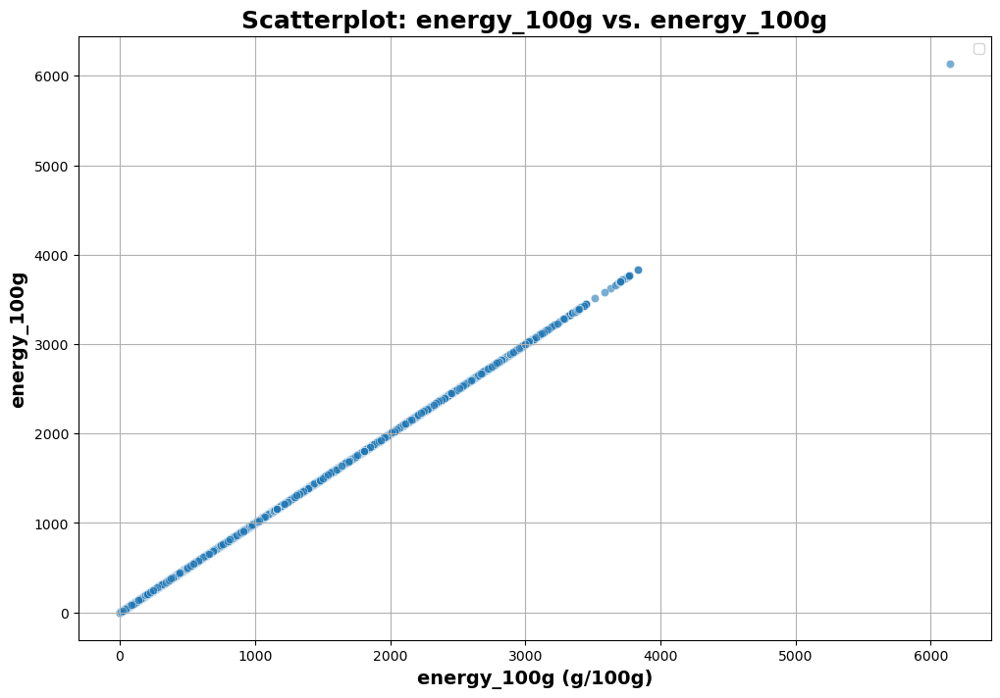

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


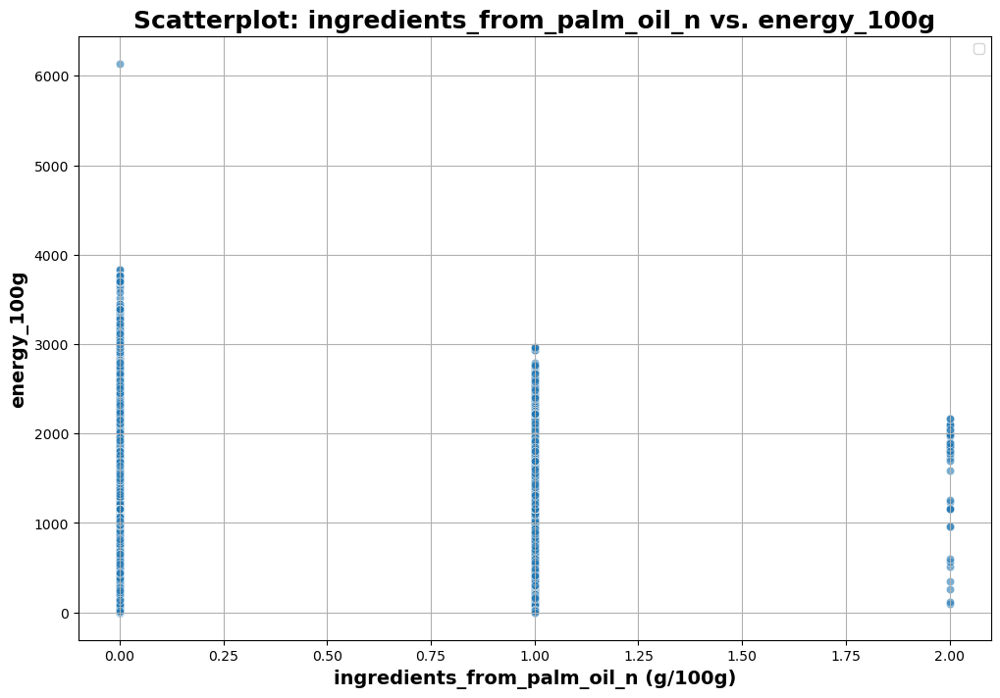

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


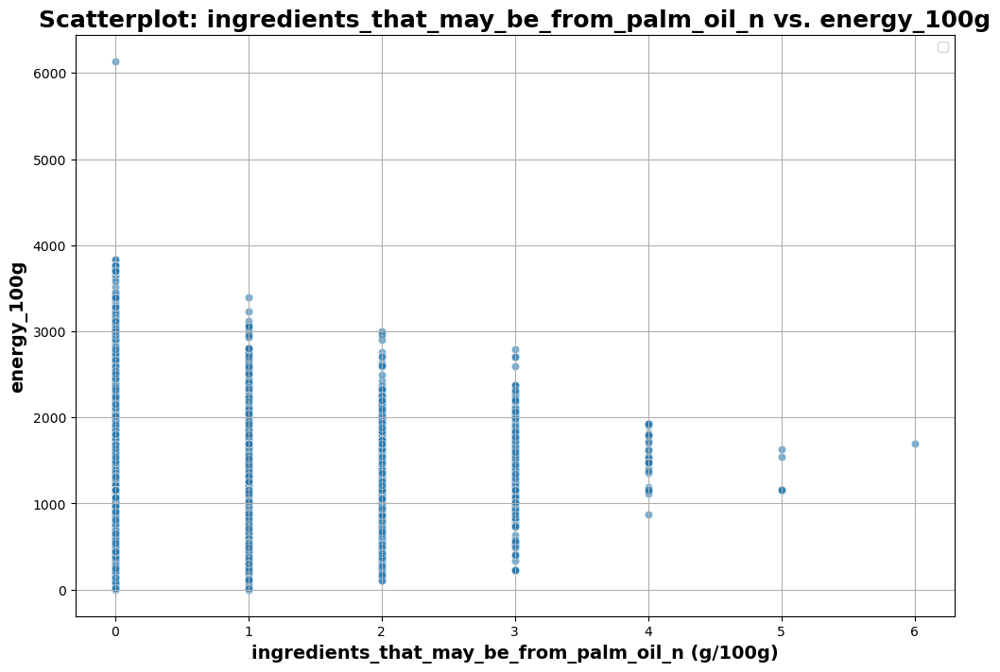

In [10]:
# ==================================================================================================
# SCATTER PLOT : 'energy_100g' vs ALL
# ==================================================================================================
numeric_features = ['saturated_fat_100g', 'sugars_100g', 'sodium_100g', 'salt_100g', 'carbohydrates_100g', 'fat_100g', 'proteins_100g', 'energy_100g', 'ingredients_from_palm_oil_n', 'ingredients_that_may_be_from_palm_oil_n']
for indicator in numeric_features:
    plot_outlier_scatter(df_data, indicator, 'energy_100g')

## II.3. Quel est le nombre de produit vendu dans chaque pays ? 

In [11]:
# Step 1: Create a copy of the DataFrame
df_data_copy = df_data.copy()

# Step 1: Remove substrings starting with 'en:' until a comma is encountered
df_data_copy['countries_fr'] = df_data['countries_fr'].str.replace(r'en:[^,]+', '', regex=True)

# Step 2: Split values in the "countries" column
df_data_copy['countries_fr'] = df_data_copy['countries_fr'].str.split(',')

# Step 3: Create a list of all countries
all_countries = [country for sublist in df_data_copy['countries_fr'] for country in sublist]

# Step 4: Count occurrences of each country
country_counts = pd.Series(all_countries).value_counts()

# Step 5: Display the counts for each country after filtering
print("Number of products sold in each country (with more than one occurrence):")
print(country_counts)


Number of products sold in each country (with more than one occurrence):
france            60467
allemagne          6584
espagne            4116
suisse             3153
royaume-uni        2858
                  ...  
scotland              1
belgie                1
niederlande           1
republik-china        1
vanuatu               1
Name: count, Length: 164, dtype: int64


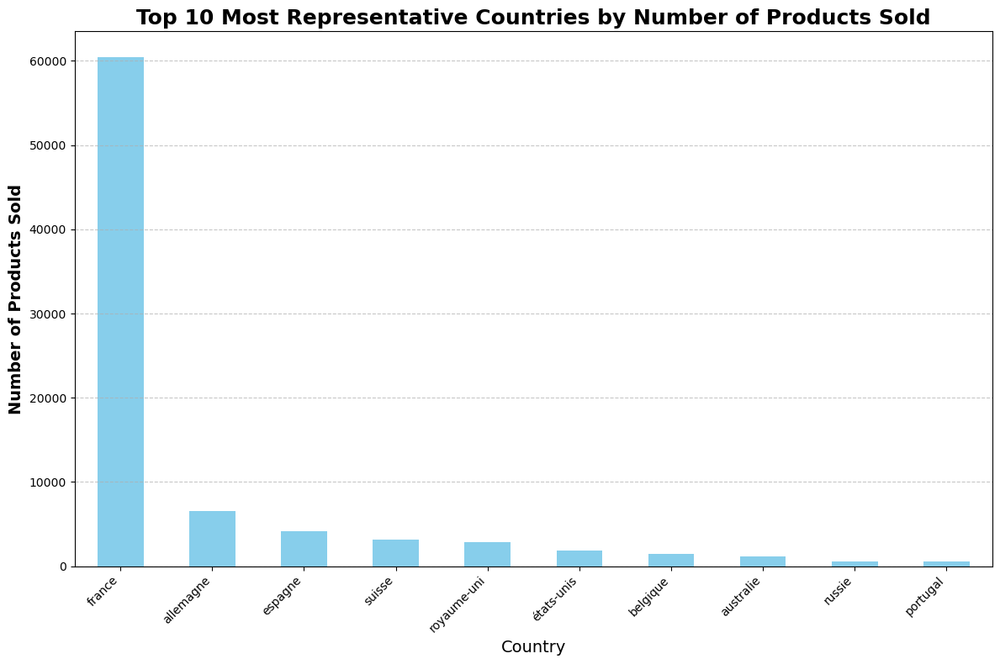

In [12]:
# Selecting the top N most representative countries
top_countries = country_counts.head(10)  

# Plotting
plt.figure(figsize=(12, 8))  
top_countries.plot(kind='bar', color='skyblue')

# Title with increased font size
plt.title('Top 10 Most Representative Countries by Number of Products Sold', fontsize=18, fontweight='bold')

# Axis labels with increased font size
plt.xlabel('Country', fontsize=14)
plt.ylabel('Number of Products Sold', fontsize=14, fontweight='bold')

# Rotate x-axis tick labels for better readability
plt.xticks(rotation=45, ha='right')

# Grid lines
plt.grid(axis='y', linestyle='--', alpha=0.7)

plt.tight_layout()
plt.show()

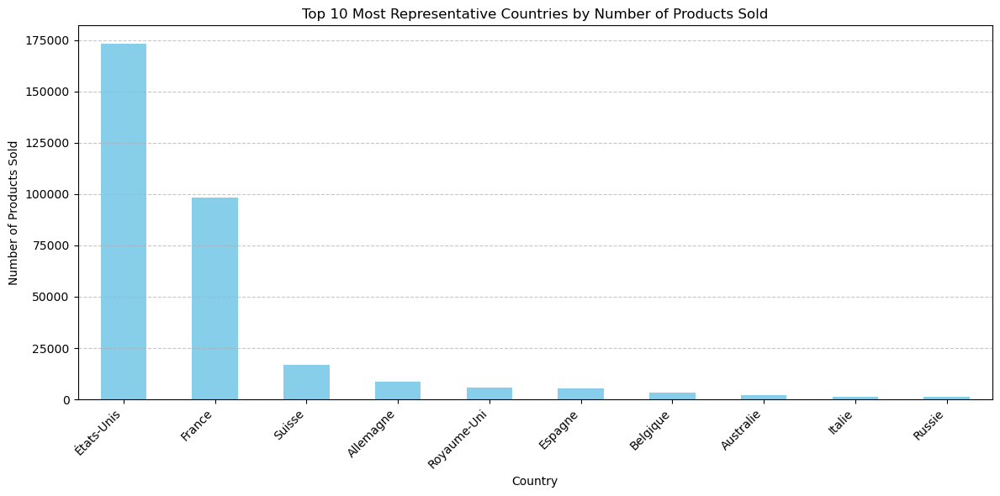

## II.4. Quel est la répartition du nutriscore dans chaque pays ? 

C:\Users\Olivi\AppData\Local\Temp\ipykernel_3988\65170081.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_nutriscore.dropna(subset=['nutrition_grade_fr', 'countries_fr'], inplace=True)
C:\Users\Olivi\AppData\Local\Temp\ipykernel_3988\65170081.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_nutriscore['countries_fr'] = df_nutriscore['countries_fr'].str.replace(r'en:[^,]+', '', regex=True)
C:\Users\Olivi\AppData\Local\Temp\ipykernel_3988\65170081.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try usi

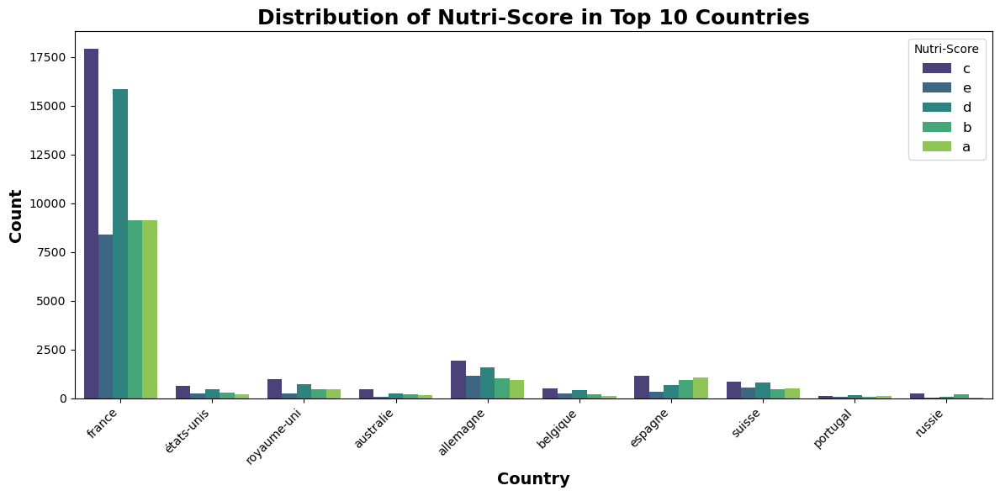

In [13]:
# Step 1: Filter the DataFrame
df_nutriscore = df_data[['nutrition_grade_fr', 'countries_fr']]

# Step 2: Drop rows with missing values
df_nutriscore.dropna(subset=['nutrition_grade_fr', 'countries_fr'], inplace=True)

# Step 3: Remove substrings starting with 'en:' until a comma is encountered
df_nutriscore['countries_fr'] = df_nutriscore['countries_fr'].str.replace(r'en:[^,]+', '', regex=True)

# Step 4: Split values in the 'countries_fr' column if necessary
df_nutriscore['countries_fr'] = df_nutriscore['countries_fr'].str.split(',')

# Step 5: Explode the DataFrame to create one row for each country in the list
df_nutriscore_exploded = df_nutriscore.explode('countries_fr')

# Step 6: Group the data by country and Nutri-Score, and count occurrences
nutriscore_distribution = df_nutriscore_exploded.groupby(['countries_fr', 'nutrition_grade_fr']).size().unstack(fill_value=0)

# Step 7: Select the top N countries with the most products
top_countries = df_nutriscore_exploded['countries_fr'].value_counts().nlargest(10).index.tolist()
df_nutriscore_top = df_nutriscore_exploded[df_nutriscore_exploded['countries_fr'].isin(top_countries)]

# Step 8: Plot the distribution of Nutri-Score within each of the top N countries
plt.figure(figsize=(12, 6))
sns.countplot(data=df_nutriscore_top, x='countries_fr', hue='nutrition_grade_fr', palette='viridis')
plt.title('Distribution of Nutri-Score in Top 10 Countries', fontsize=18, fontweight='bold')
plt.xlabel('Country', fontsize=14, fontweight='bold')
plt.ylabel('Count', fontsize=14, fontweight='bold')
plt.xticks(rotation=45, ha='right')
plt.legend(title='Nutri-Score', fontsize=12)
plt.tight_layout()
plt.show()


C:\Users\Olivi\AppData\Local\Temp\ipykernel_3988\2123879176.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_nutriscore.dropna(subset=['nutrition_grade_fr', 'countries_fr'], inplace=True)
C:\Users\Olivi\AppData\Local\Temp\ipykernel_3988\2123879176.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_nutriscore['countries_fr'] = df_nutriscore['countries_fr'].str.replace(r'en:[^,]+', '', regex=True)
C:\Users\Olivi\AppData\Local\Temp\ipykernel_3988\2123879176.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
T

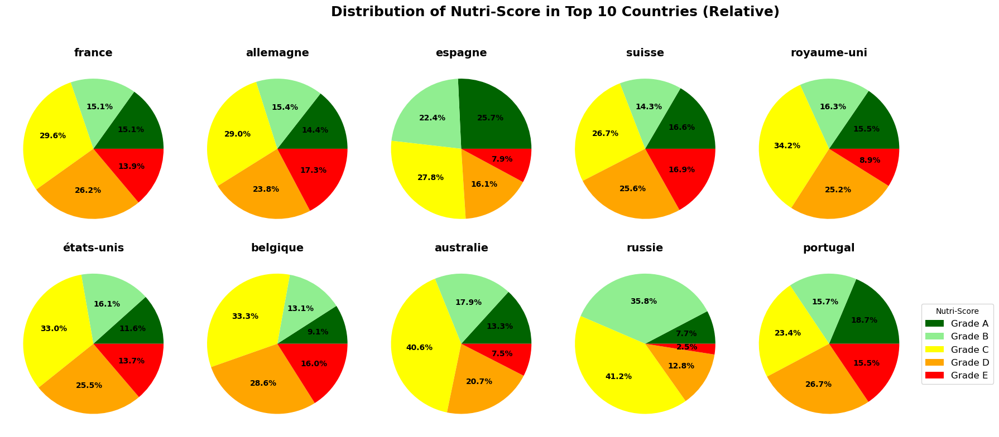

In [14]:
# Step 1: Filter the DataFrame
df_nutriscore = df_data[['nutrition_grade_fr', 'countries_fr']]

# Step 2: Drop rows with missing values
df_nutriscore.dropna(subset=['nutrition_grade_fr', 'countries_fr'], inplace=True)

# Step 3: Remove substrings starting with 'en:' until a comma is encountered
df_nutriscore['countries_fr'] = df_nutriscore['countries_fr'].str.replace(r'en:[^,]+', '', regex=True)

# Step 4: Split values in the 'countries_fr' column if necessary
df_nutriscore['countries_fr'] = df_nutriscore['countries_fr'].str.split(',')

# Step 5: Explode the DataFrame to create one row for each country in the list
df_nutriscore_exploded = df_nutriscore.explode('countries_fr')

# Step 6: Group the data by country and Nutri-Score, and count occurrences
nutriscore_distribution = df_nutriscore_exploded.groupby(['countries_fr', 'nutrition_grade_fr']).size().unstack(fill_value=0)

# Step 7: Calculate the relative frequencies of Nutri-Score within each country
nutriscore_distribution_percent = nutriscore_distribution.div(nutriscore_distribution.sum(axis=1), axis=0)

# Step 8: Select the top N countries with the most products
top_countries = df_nutriscore_exploded['countries_fr'].value_counts().nlargest(10).index.tolist()
df_nutriscore_top = df_nutriscore_exploded[df_nutriscore_exploded['countries_fr'].isin(top_countries)]


# Define color map for nutrition grades
grade_colors = {'a': 'darkgreen', 'b': 'lightgreen', 'c': 'yellow', 'd': 'orange', 'e': 'red'}

# Step 9: Plot pie charts for the top 10 countries
plt.figure(figsize=(20, 8))

for i, country in enumerate(top_countries):
    plt.subplot(2, 5, i + 1)  # 2 rows, 5 columns
    sizes = nutriscore_distribution_percent.loc[country].values
    labels = nutriscore_distribution_percent.columns
    colors = [grade_colors[label] for label in labels]  # Get colors based on Nutri-Score grade
    wedges, texts, autotexts = plt.pie(sizes, labels=None, colors=colors, startangle=0, autopct='%1.1f%%', textprops={'fontsize': 12})
    plt.setp(autotexts, size=10, weight='bold', color='black')  # Set properties of autopct text
    plt.setp(texts, size=10)  # Set properties of label text
    plt.title(country, fontsize=14, fontweight='bold')

# Create a legend for Nutri-Score labels
legend_labels = ['Grade A', 'Grade B', 'Grade C', 'Grade D', 'Grade E']
plt.legend(wedges, legend_labels, loc='center left', bbox_to_anchor=(1, 0.5), title='Nutri-Score', fontsize=12)

plt.suptitle('Distribution of Nutri-Score in Top 10 Countries (Relative)', fontsize=18, fontweight='bold')
plt.tight_layout(rect=[0, 0, 0.9, 0.95])  # Adjust layout to make room for legend
plt.show()

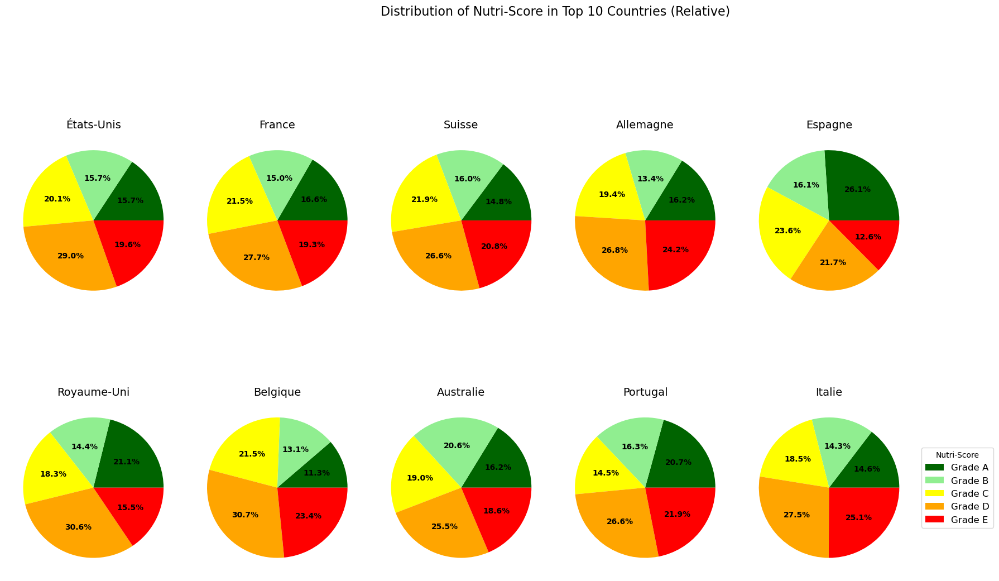

# STEP 3. Analyse Multivariée
1. Utilisez des techniques de visualisation avancées telles que des matrices de corrélation, des graphiques en nuage de points colorés, ou des graphiques en 3D pour étudier les relations entre plusieurs variables à la fois.
2. Utilisez des méthodes statistiques telles que l'analyse de variance (ANOVA), l'analyse en composantes principales (ACP) ou encore l'analyse de corrélation canonique (CCA) pour quantifier les interactions entre les features.
3. Divisez vos données en sous-groupes pertinents en fonction d'une feature spécifique pour étudier comment les autres features varient en fonction de cette feature.

## III.0. Descriptives Statistiques

In [15]:
# ==================================================================================================
# STATISTIQUES DESCRIPTIVES (NUMERICAL FEATURES)
# ==================================================================================================
# List of numerical features
numeric_features = ['nutrition_score_fr_100g', 'saturated_fat_100g', 'sugars_100g', 'sodium_100g', 'salt_100g', 'carbohydrates_100g', 'fat_100g', 'proteins_100g', 'energy_100g', 'ingredients_from_palm_oil_n', 'ingredients_that_may_be_from_palm_oil_n']
categoric_features = ['TARGET_main_category_fr', 'generic_name', 'nutrition_grade_fr', 'ingredients_text', 'brands', 'product_name', 'countries_fr', 'pnns_groups_2', 'categories_fr', 'code', 'quantity']

# Calculate descriptive statistics for numerical features
numeric_stats = df_data[numeric_features].describe()
numeric_stats = numeric_stats.T

# Calculate mode, skewness, and kurtosis for numerical features
numeric_mode = df_data[numeric_features].mode().iloc[0]
numeric_skewness = df_data[numeric_features].skew()
numeric_kurtosis = df_data[numeric_features].kurtosis()

# Concatenate descriptive statistics, mode, skewness, and kurtosis into a single DataFrame
combined_numeric_stats = pd.concat([numeric_stats, numeric_mode, numeric_skewness, numeric_kurtosis], axis=1)

# Rename the columns for clarity
combined_numeric_stats.columns = ['count', 'mean', 'std', 'min', '25%', '50%', '75%', 'max', 'mode', 'skewness', 'kurtosis']

# Print the combined dataframe for numerical features
print("Combined Descriptive Statistics, Mode, Skewness, and Kurtosis for Numerical Features:")
display(combined_numeric_stats)



# ==================================================================================================
# STATISTIQUES DESCRIPTIVES (CATEGORICAL FEATURES)
# ==================================================================================================
# # For categorical features, you can only calculate mode
categorical_mode = df_data[categoric_features].mode().iloc[0]

# # Print the mode for categorical features
print("\nMode for Categorical Features:")
display(categorical_mode)




Combined Descriptive Statistics, Mode, Skewness, and Kurtosis for Numerical Features:


,count,mean,std,min,25%,50%,75%,max,mode,skewness,kurtosis
nutrition_score_fr_100g,81688.00,7.22,7.87,0.00,0.00,4.00,13.00,40.00,0.00,0.81,-0.53
saturated_fat_100g,81688.00,5.18,7.07,0.00,0.60,3.40,5.82,100.00,5.82,3.75,24.65
sugars_100g,81688.00,12.96,15.75,0.00,2.00,10.71,13.28,100.00,13.28,2.30,6.02
sodium_100g,81688.00,0.43,1.46,0.00,0.05,0.33,0.48,83.00,0.48,21.06,569.13
salt_100g,81688.00,1.07,3.53,0.00,0.13,0.83,1.20,100.00,1.20,19.94,480.17
carbohydrates_100g,81688.00,27.02,23.51,0.00,7.50,27.10,36.80,100.00,29.33,0.86,-0.19
fat_100g,81688.00,13.07,15.07,0.00,1.53,11.50,14.71,100.00,14.71,2.47,8.88
proteins_100g,81688.00,7.22,6.71,0.00,1.70,7.00,8.16,88.50,8.16,2.00,8.79
energy_100g,81688.00,1046.11,692.13,0.00,398.00,1163.71,1481.00,6138.00,1163.71,0.52,-0.15
ingredients_from_palm_oil_n,81688.00,0.05,0.22,0.00,0.00,0.00,0.00,2.00,0.00,4.45,19.00



Mode for Categorical Features:


TARGET_main_category_fr                                             Boissons
generic_name               pâtes alimentaires au blé dur de qualité supér...
nutrition_grade_fr                                                         c
ingredients_text                 semoule de _blé_ dur de qualité supérieure.
brands                                                             carrefour
product_name                                      huile d'olive vierge extra
countries_fr                                                          france
pnns_groups_2                                                        unknown
categories_fr                     snacks sucrés,biscuits et gâteaux,biscuits
code                                                                  635646
quantity                                                               500 g
Name: 0, dtype: object

## III.1. CORRELATION Analysis for Numerical Features

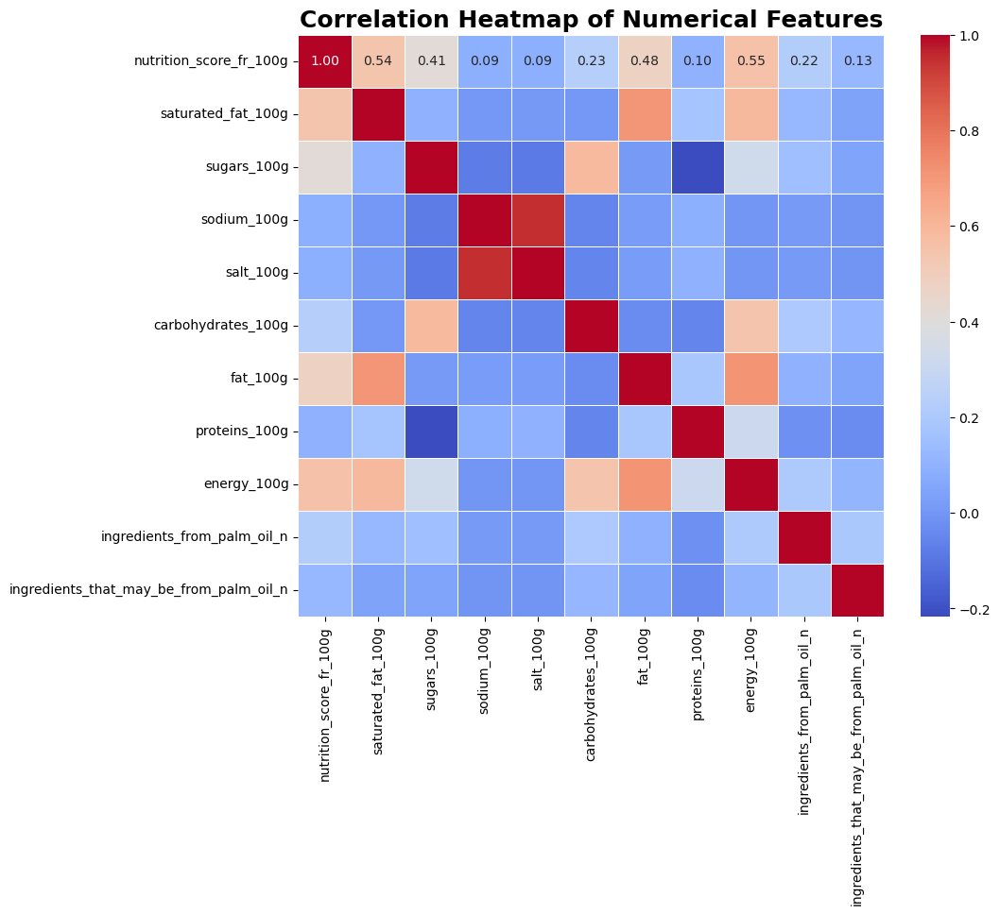

In [16]:
# ==================================================================================================
# CORRELATION HEATMAP BETWEEN MY NUMERICAL FEATURES
# ==================================================================================================
# List of numerical features
numeric_features = ['nutrition_score_fr_100g', 'saturated_fat_100g', 'sugars_100g', 'sodium_100g', 'salt_100g', 'carbohydrates_100g', 'fat_100g', 'proteins_100g', 'energy_100g', 'ingredients_from_palm_oil_n', 'ingredients_that_may_be_from_palm_oil_n']
# Calculate the correlation matrix
correlation_matrix = df_data[numeric_features].corr()

# Plot heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f", linewidths=0.5)
plt.title('Correlation Heatmap of Numerical Features', fontsize=18, fontweight='bold')
plt.show()

## III.2. Principal Component Analysis (PCA) - DIMENSION REDUCTION FOR NUMERICAL DIMENSIONS
ANOVA can be computationally expensive, especially with a large dataset and multiple features. Before using it, i'm going to reduce the number of features (numerical) by performing the PCA!

In [17]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

7


,Components,Information Retained
0,1,0.29
1,2,0.47
2,3,0.63
3,4,0.72
4,5,0.81
5,6,0.88
6,7,0.93
7,8,0.96
8,9,0.99
9,10,1.00


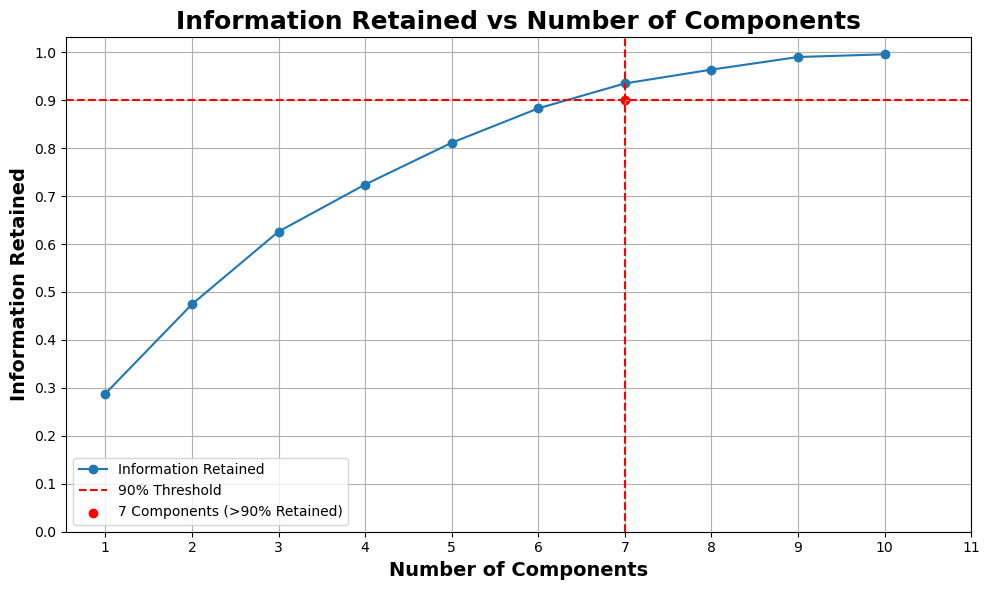

In [18]:
# ==================================================================================================
# How much PCA should i keep to retain >90% of the information ?
# ==================================================================================================
# Select numerical features
numeric_features = ['nutrition_score_fr_100g', 'saturated_fat_100g', 'sugars_100g', 'sodium_100g', 'salt_100g', 'carbohydrates_100g', 'fat_100g', 'proteins_100g', 'energy_100g', 'ingredients_from_palm_oil_n', 'ingredients_that_may_be_from_palm_oil_n']

# Step 1: Standardize the data
X = df_data[numeric_features]
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Initialize a list to store information_retained values
information_retained_list = []

# Step 2: Fit PCA
for i in range(1, len(numeric_features)):
    pca = PCA(n_components=i)  # Specify the number of components
    pca.fit(X_scaled)
    X_pca = pca.transform(X_scaled)
    
    information_retained = sum(pca.explained_variance_ratio_)
    information_retained_list.append(information_retained)

# Create a DataFrame from the information_retained list
info_df = pd.DataFrame({
    'Components': range(1, len(numeric_features)),
    'Information Retained': information_retained_list
})

# Find the number of components required to retain at least 90% of the information
required_components = info_df[info_df['Information Retained'] >= 0.9]['Components'].iloc[0]
print(required_components)

display(info_df)


# Plot information retained vs number of components
plt.figure(figsize=(10, 6))
plt.plot(info_df['Components'], info_df['Information Retained'], marker='o', linestyle='-', label='Information Retained')
plt.axhline(y=0.9, color='r', linestyle='--', label='90% Threshold')
plt.axvline(x=required_components, color='r', linestyle='--')
plt.scatter(required_components, 0.9, color='r', marker='o', label=f'{required_components} Components (>90% Retained)')

# Bold title with increased font size
plt.title('Information Retained vs Number of Components', fontsize=18, fontweight='bold')

# Axis labels with increased font size and bold
plt.xlabel('Number of Components', fontsize=14, fontweight='bold')
plt.ylabel('Information Retained', fontsize=14, fontweight='bold')

plt.grid(True)
plt.xticks(range(1, len(numeric_features) + 1))
plt.yticks(np.arange(0, 1.1, 0.1))
plt.legend()
plt.tight_layout()
plt.show()



In [19]:
# ==================================================================================================
# APPLY PCA
# ==================================================================================================
# Select numerical features
numeric_features = ['nutrition_score_fr_100g', 'saturated_fat_100g', 'sugars_100g', 'sodium_100g', 'salt_100g', 'carbohydrates_100g', 'fat_100g', 'proteins_100g', 'energy_100g', 'ingredients_from_palm_oil_n', 'ingredients_that_may_be_from_palm_oil_n']

# Step 1: Standardize the data / CENTRATE & REDUCE (mean to 0 and STD to 1). 
X = df_data[numeric_features]
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

#  Check mean and standard deviation of the standardized data
print("Mean of standardized data:", np.mean(X_scaled, axis=0))
print("Standard deviation of standardized data:", np.std(X_scaled, axis=0))
print('\n')

# Step 2: Fit PCA
pca = PCA(n_components=len(numeric_features))  # Specify the number of components
pca.fit(X_scaled)



Mean of standardized data: [ 8.62866509e-17  4.38391855e-17  1.01595573e-16  5.56688070e-18
 -8.35032105e-18 -2.00407705e-16 -1.43347178e-16 -1.32213417e-17
  4.45350456e-17  5.98439676e-17 -2.08758026e-17]
Standard deviation of standardized data: [1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.]




PCA(n_components=11)

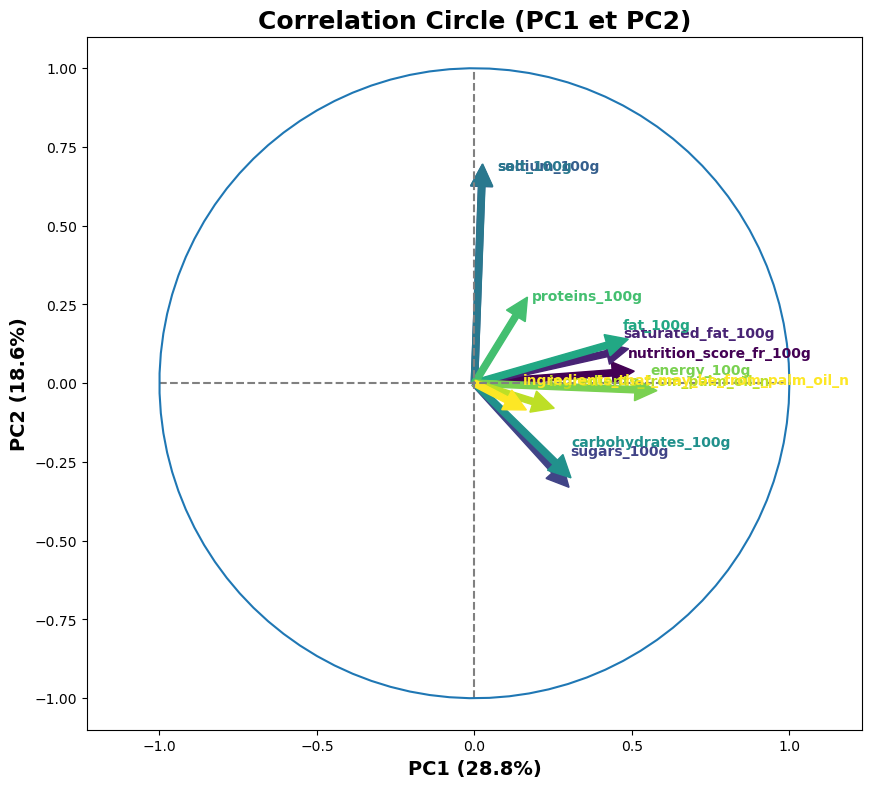

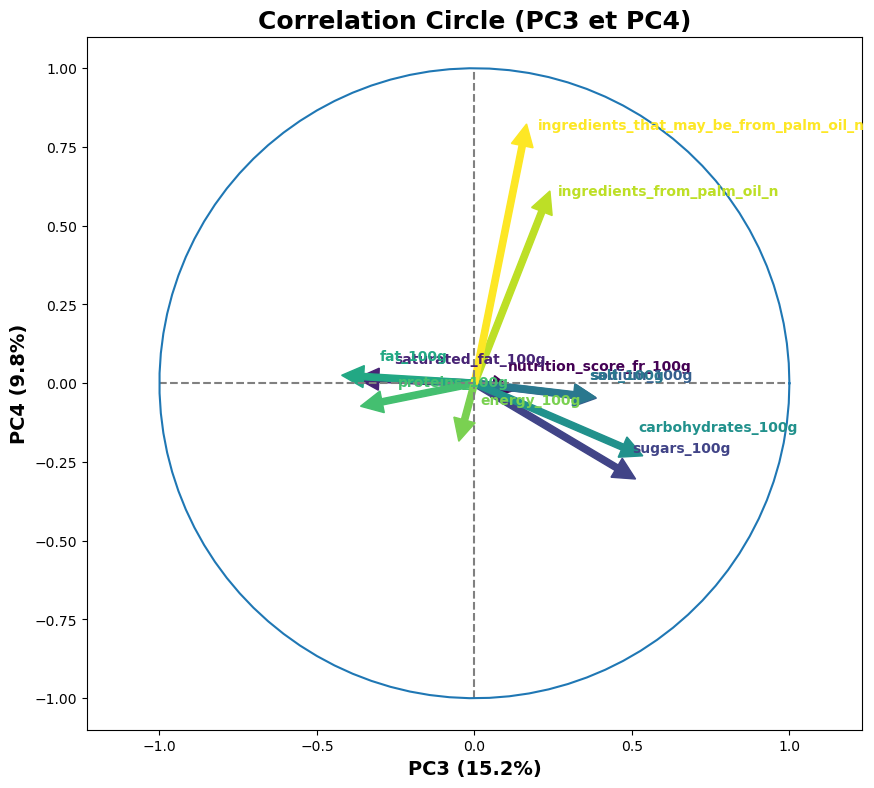

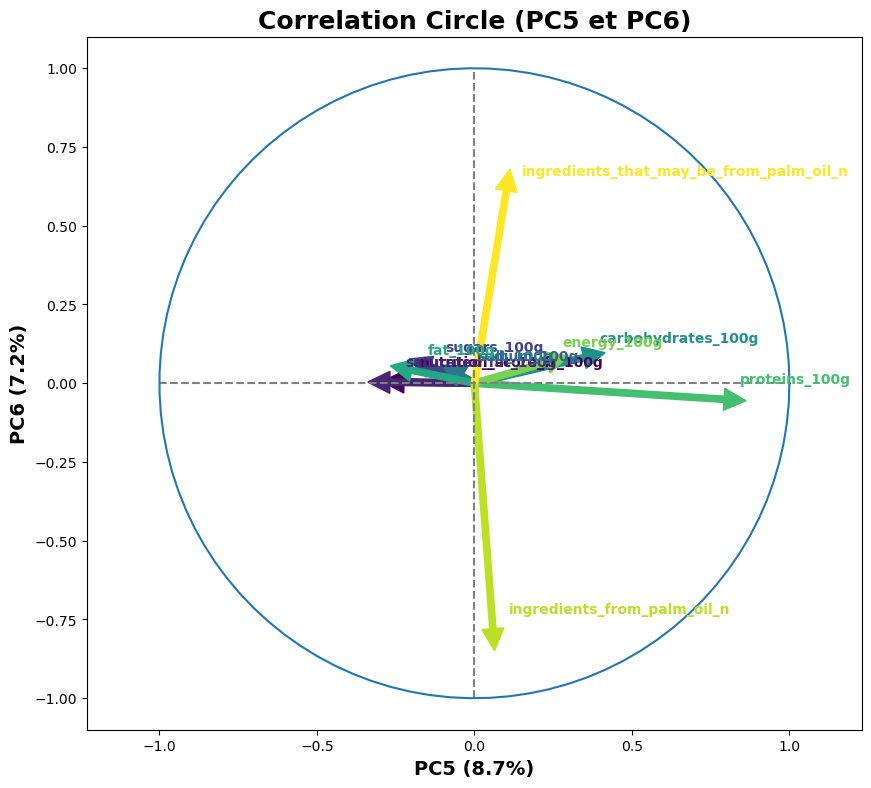

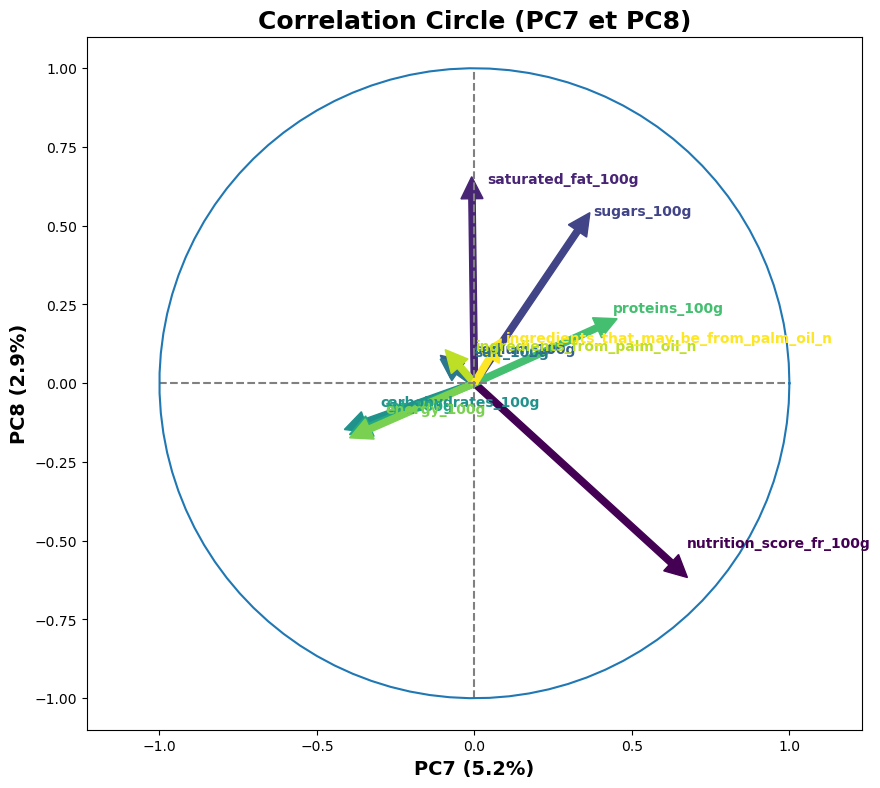

In [20]:
# ==================================================================================================
# PLOT PC1 vs PC2 (Nuage des variables)
# PLOT PC3 vs PC4 (Nuage des variables)
# PLOT PC5 vs PC6 (Nuage des variables)
# ==================================================================================================
def correlation_graph(pca, x_y, features):
    """Affiche le graphe des correlations

    Positional arguments:
    -----------------------------------
    pca : sklearn.decomposition.PCA : notre objet PCA qui a été fit
    x_y : list ou tuple : le couple x,y des plans à afficher, exemple [0,1] pour F1, F2
    features : list ou tuple : la liste des features (ie des dimensions) à représenter
    """

    # Extrait x et y
    x, y = x_y

    # Taille de l'image (en inches)
    fig, ax = plt.subplots(figsize=(10, 9))

    # Define colors for arrows
    arrow_colors = plt.cm.viridis(np.linspace(0, 1, pca.components_.shape[1]))

    # Pour chaque composante :
    for i in range(0, pca.components_.shape[1]):

        # Les flèches avec couleur spécifique
        ax.arrow(0, 0,
                 pca.components_[x, i],
                 pca.components_[y, i],
                 head_width=0.07,
                 head_length=0.07,
                 width=0.02,
                 color=arrow_colors[i])  # Assign unique color to each arrow

        # Les labels avec la même couleur que la flèche
        plt.text(pca.components_[x, i] + 0.05,
                 pca.components_[y, i] + 0.05,
                 features[i],
                 color=arrow_colors[i], fontweight='bold')  # Set text color same as arrow color

    # Affichage des lignes horizontales et verticales
    plt.plot([-1, 1], [0, 0], color='grey', ls='--')
    plt.plot([0, 0], [-1, 1], color='grey', ls='--')

    # Nom des axes, avec le pourcentage d'inertie expliqué
    plt.xlabel('PC{} ({}%)'.format(x+1, round(100*pca.explained_variance_ratio_[x], 1)), fontsize=14, fontweight='bold')
    plt.ylabel('PC{} ({}%)'.format(y+1, round(100*pca.explained_variance_ratio_[y], 1)), fontsize=14, fontweight='bold')

    # Title with font size and weight adjustments
    plt.title("Correlation Circle (PC{} et PC{})".format(x+1, y+1), fontsize=18, fontweight='bold')

    # Le cercle
    an = np.linspace(0, 2 * np.pi, 100)
    plt.plot(np.cos(an), np.sin(an))  # Add a unit circle for scale

    # Axes et display
    plt.axis('equal')
    plt.show(block=False)

# Plot PC1 vs PC2
correlation_graph(pca, (0,1), numeric_features)
# Plot PC3 vs PC4
correlation_graph(pca, (2,3), numeric_features)
# Plot PC5 vs PC6
correlation_graph(pca, (4,5), numeric_features)

correlation_graph(pca, (6,7), numeric_features)

In [21]:
# ==================================================================================================
# REGROUP THE INFORMATION OF PC for each FEATURE
# PC1 = 0.47*nutrition_score_fr_100g + 0.41*saturated_fat_100g + 0.27*sugars_100g -0.06*sodium_100g + ... + 0.18*ingredients_from_palm_oil_n + 0.08*ingredients_that_may_be_from_palm_oil_n. 
# ==================================================================================================
# Create a DataFrame for PCA values vs indicators
df_pca = pd.DataFrame(pca.components_, columns=numeric_features)

# Add a column for the principal component number
df_pca['Principal_Component'] = ['PC{}'.format(i+1) for i in range(df_pca.shape[0])]

# Reorder columns for better readability
df_pca = df_pca[['Principal_Component'] + numeric_features]

# Display the DataFrame  
display(df_pca)

,Principal_Component,nutrition_score_fr_100g,saturated_fat_100g,sugars_100g,sodium_100g,salt_100g,carbohydrates_100g,fat_100g,proteins_100g,energy_100g,ingredients_from_palm_oil_n,ingredients_that_may_be_from_palm_oil_n
0,PC1,0.44,0.42,0.25,0.02,0.02,0.26,0.42,0.13,0.51,0.19,0.10
1,PC2,0.03,0.09,-0.28,0.62,0.63,-0.25,0.12,0.21,-0.02,-0.06,-0.05
2,PC3,0.06,-0.30,0.45,0.32,0.31,0.47,-0.35,-0.29,-0.03,0.21,0.15
3,PC4,-0.01,0.01,-0.27,-0.04,-0.04,-0.20,0.02,-0.06,-0.12,0.55,0.75
4,PC5,-0.22,-0.27,-0.14,-0.04,-0.04,0.35,-0.20,0.79,0.23,0.06,0.10
5,PC6,0.00,0.00,0.05,0.02,0.02,0.08,0.04,-0.05,0.07,-0.78,0.61
6,PC7,0.62,-0.01,0.33,-0.05,-0.05,-0.35,-0.33,0.39,-0.33,-0.05,0.05
7,PC8,-0.57,0.59,0.48,0.04,0.04,-0.12,-0.14,0.18,-0.15,0.05,0.08
8,PC9,0.19,0.55,-0.47,-0.01,-0.01,0.38,-0.52,-0.10,-0.10,-0.05,-0.04
9,PC10,-0.04,-0.03,0.01,-0.00,0.01,-0.45,-0.50,-0.16,0.73,-0.00,-0.00


,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,PC11
0,-2.02,-0.45,0.09,0.05,-0.76,-0.14,-0.08,0.22,-0.08,0.03,0.00
1,-1.44,-0.47,0.25,0.06,-1.18,-0.14,0.97,-0.78,0.26,-0.00,0.01
2,-1.44,-0.44,0.26,0.06,-1.18,-0.14,0.97,-0.78,0.26,-0.00,0.01
3,-2.02,-0.45,0.09,0.05,-0.76,-0.14,-0.08,0.22,-0.08,0.03,0.00
4,-2.02,-0.45,0.09,0.05,-0.76,-0.14,-0.08,0.22,-0.08,0.03,0.00
...,...,...,...,...,...,...,...,...,...,...,...
81683,-0.25,0.06,-0.17,-0.37,0.30,0.02,-0.65,0.53,-0.17,0.03,-0.00
81684,-0.25,0.06,-0.17,-0.37,0.30,0.02,-0.65,0.53,-0.17,0.03,-0.00
81685,-2.41,-0.21,-0.34,0.35,-0.92,-0.23,0.14,-0.18,0.14,0.04,0.01
81686,-0.25,0.06,-0.17,-0.37,0.30,0.02,-0.65,0.53,-0.17,0.03,-0.00


IndexError: list index out of range

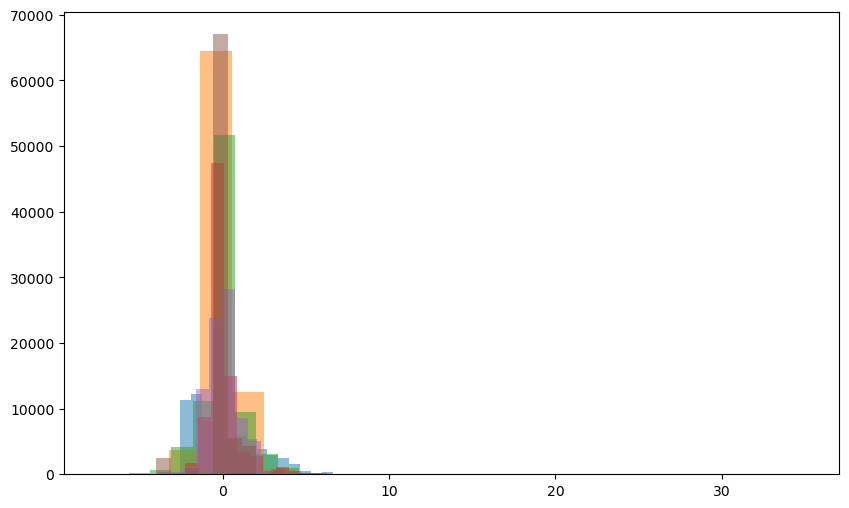

In [22]:
# ==================================================================================================
# GTE THE DISTRIBUTION OF PC1, ..., PC6
# CHECK THEIR NORMALITY (SKEW)
# ==================================================================================================
from scipy.stats import skew

# Calculate the PC values for each observation in the dataset
PC_values = np.dot(X_scaled, pca.components_.T)

# Create a DataFrame to store the PC values
df_PC_values = pd.DataFrame(PC_values, columns=[f'PC{i+1}' for i in range(len(numeric_features))])

# Display the DataFrame
display(df_PC_values)

# Calculate the skewness of each PC
PC_skewness = [skew(df_PC_values[f'PC{i+1}']) for i in range(6)]

# Plot the distribution of each PC along with their skewness
plt.figure(figsize=(10, 6))
for i in range(7):
    plt.hist(df_PC_values[f'PC{i+1}'], bins=20, alpha=0.5, label=f'PC{i+1} (Skewness: {PC_skewness[i]:.2f})')
plt.title('Distribution of Principal Components', fontsize=18, fontweight='bold')
plt.xlabel('Principal Component Value', fontsize=14, fontweight='bold')
plt.ylabel('Frequency', fontsize=14, fontweight='bold')
plt.legend()
plt.grid(True)
plt.show()


In [ ]:
# PROJECTTION

In [ ]:
# ==================================================================================================
# PROJECTION OF THE INDIVIDUS ON THE FACTORIAL PLANS
# ==================================================================================================

X_proj = pca.transform(X_scaled)
X_proj[:5]

def display_factorial_planes(   X_projected, 
                                x_y, 
                                pca=None, 
                                labels = None,
                                clusters=None, 
                                alpha=1,
                                figsize=[10,8], 
                                marker="." ):
    """
    Affiche la projection des individus

    Positional arguments : 
    -------------------------------------
    X_projected : np.array, pd.DataFrame, list of list : la matrice des points projetés
    x_y : list ou tuple : le couple x,y des plans à afficher, exemple [0,1] pour F1, F2

    Optional arguments : 
    -------------------------------------
    pca : sklearn.decomposition.PCA : un objet PCA qui a été fit, cela nous permettra d'afficher la variance de chaque composante, default = None
    labels : list ou tuple : les labels des individus à projeter, default = None
    clusters : list ou tuple : la liste des clusters auquel appartient chaque individu, default = None
    alpha : float in [0,1] : paramètre de transparence, 0=100% transparent, 1=0% transparent, default = 1
    figsize : list ou tuple : couple width, height qui définit la taille de la figure en inches, default = [10,8] 
    marker : str : le type de marker utilisé pour représenter les individus, points croix etc etc, default = "."
    """

    # Transforme X_projected en np.array
    X_ = np.array(X_projected)

    # On définit la forme de la figure si elle n'a pas été donnée
    if not figsize: 
        figsize = (7,6)

    # On gère les labels
    if  labels is None : 
        labels = []
    try : 
        len(labels)
    except Exception as e : 
        raise e

    # On vérifie la variable axis 
    if not len(x_y) ==2 : 
        raise AttributeError("2 axes sont demandées")   
    if max(x_y )>= X_.shape[1] : 
        raise AttributeError("la variable axis n'est pas bonne")   

    # on définit x et y 
    x, y = x_y

    # Initialisation de la figure       
    fig, ax = plt.subplots(1, 1, figsize=figsize)

    # On vérifie s'il y a des clusters ou non
    c = None if clusters is None else clusters
 
    # Les points    
    # plt.scatter(   X_[:, x], X_[:, y], alpha=alpha, 
    #                     c=c, cmap="Set1", marker=marker)
    sns.scatterplot(data=None, x=X_[:, x], y=X_[:, y], hue=c, alpha=0.5)

    # Si la variable pca a été fournie, on peut calculer le % de variance de chaque axe 
    if pca : 
        v1 = str(round(100*pca.explained_variance_ratio_[x]))  + " %"
        v2 = str(round(100*pca.explained_variance_ratio_[y]))  + " %"
    else : 
        v1=v2= ''

    # Nom des axes, avec le pourcentage d'inertie expliqué
    ax.set_xlabel(f'PC{x+1} {v1}',fontsize=14, fontweight='bold')
    ax.set_ylabel(f'PC{y+1} {v2}',fontsize=14, fontweight='bold')

    # Valeur x max et y max
    x_max = np.abs(X_[:, x]).max() *1.1
    y_max = np.abs(X_[:, y]).max() *1.1

    # On borne x et y 
    ax.set_xlim(left=-x_max, right=x_max)
    ax.set_ylim(bottom= -y_max, top=y_max)

    # Affichage des lignes horizontales et verticales
    plt.plot([-x_max, x_max], [0, 0], color='grey', alpha=0.8)
    plt.plot([0,0], [-y_max, y_max], color='grey', alpha=0.8)

    # Affichage des labels des points
    if len(labels) : 
        # j'ai copié collé la fonction sans la lire
        for i,(_x,_y) in enumerate(X_[:,[x,y]]):
            plt.text(_x, _y+0.05, labels[i], fontsize='14', ha='center',va='center') 

    # Titre et display
    plt.title(f"Projection des individus (sur PC{x+1} et PC{y+1})",fontsize=18, fontweight='bold')
    plt.show()


x_y = [0,1]
display_factorial_planes(X_proj, x_y, clusters=df_data['nutrition_score_fr_100g'])

x_y = [2,3]
display_factorial_planes(X_proj, x_y, clusters=df_data['ingredients_that_may_be_from_palm_oil_n'])

x_y = [4,5]
display_factorial_planes(X_proj, x_y, clusters=df_data['ingredients_from_palm_oil_n'])

# x_y = [0,1]
# names = df_data['TARGET_main_category_fr']
# display_factorial_planes(X_proj, x_y, pca, labels=names, figsize=(20,16), clusters=df_data[numeric_features]['nutrition_score_fr_100g'], marker="o")

## III.3. REDUCE THE DIMENSIONS OF MY DATASET BASED ON THE INSIGHT OF PCA

In [ ]:
# Select only the columns 'PC1' to 'PC6' from df_PC_values
df_PC_values_subset = df_PC_values[['PC1', 'PC2', 'PC3', 'PC4', 'PC5', 'PC6']]

# Merge the selected columns with df_data based on their indexes
merged_df_FULL = df_data.merge(df_PC_values_subset, left_index=True, right_index=True)


# IN PC1 vs PC2 , wesaw a big correlation for fat & saturated fat in the PC1 direction. 
# --> We rename PC1 the fat ratio
# IN PC1 vs PC2 , wesaw a big correlation for salt & sodium in the PC2 direction. 
# --> We rename PC2 the salt ratio. 
# IN PC3 vs PC4, wesaw a big correlation for sugar & carbohydrates in the PC3 direction. 
# 
# --> WE REMOVE fat, saturated fat, salt, sodium, sugar and carbohydrates. 
#
# WE DON'T KEEP PC4 to PC6 since they are only link to one parameter in priority. 
# --> SO WE KEEP PC1 (the fat ratio), PC2 (the salt ratio), PC3 (the sugar ratio), nutrition_score_fr_100g, 'sugars_100g', 'carbohydrates_100g', 'proteins_100g', 'energy_100g', 'ingredients_from_palm_oil_n', 'ingredients_that_may_be_from_palm_oil_n'
# --> We succesfuly reduce the dimension by two !


# First we copy the full dataframe. 
merged_df_forAnalysis = merged_df_FULL

# List of columns to drop
columns_to_drop = ['sugars_100g', 'carbohydrates_100g', 'fat_100g', 'saturated_fat_100g', 'salt_100g', 'sodium_100g', 'PC4', 'PC5', 'PC6']
# Drop the columns from the DataFrame
merged_df_forAnalysis.drop(columns=columns_to_drop, inplace=True)

merged_df_forAnalysis.rename(columns={'PC1': 'FAT_RATIO_PC1'}, inplace=True)
merged_df_forAnalysis.rename(columns={'PC2': 'SALT_RATIO_PC2'}, inplace=True)
merged_df_forAnalysis.rename(columns={'PC3': 'SUGAR_RATIO_PC3'}, inplace=True)
display(merged_df_forAnalysis)


## III.4. Analysis of Variance (ANOVA) (I WONT USE IT FINALLY)

In [ ]:
# NORMALITY TEST
from scipy.stats import shapiro

numerical_features = ['FAT_RATIO_PC1', 'SALT_RATIO_PC2', 'SUGAR_RATIO_PC3', 'nutrition_score_fr_100g', 'proteins_100g', 'energy_100g', 'ingredients_from_palm_oil_n', 'ingredients_that_may_be_from_palm_oil_n']
# List to store the results of the Shapiro-Wilk test
shapiro_results = []

# Perform Shapiro-Wilk test for each numerical feature
for feature in numerical_features:
    # Perform the Shapiro-Wilk test
    stat, p_value = shapiro(merged_df_forAnalysis[feature])
    
    # Store the results
    shapiro_results.append({'Feature': feature, 'Test Statistic': stat, 'p-value': p_value, 'Normal?': p_value > 0.05})

# Display the results
shapiro_df = pd.DataFrame(shapiro_results)
print("Results of Shapiro-Wilk test for normality:")
display(shapiro_df)


In [ ]:
# import statsmodels.api as sm
# from statsmodels.formula.api import ols

# numeric_features = ['nutrition_score_fr_100g', 'saturated_fat_100g', 'sugars_100g', 'sodium_100g', 'salt_100g', 'carbohydrates_100g', 'fat_100g', 'proteins_100g', 'energy_100g', 'ingredients_from_palm_oil_n', 'ingredients_that_may_be_from_palm_oil_n']

# # Step 1: Data Preparation (Assuming your numerical features are in a DataFrame df_features and the target variable is in df_target)
# # Make sure your data is properly cleaned and encoded
# # Example:
# df_features = df_data[numeric_features]
# df_target = df_data['TARGET_main_category_fr']

# # Step 2: ANOVA Calculation
# # Perform ANOVA for each numerical feature with respect to the categorical target variable
# anova_results = {}
# for feature in df_features.columns:
#     formula = f"{feature} ~ C(df_target)"
#     model = ols(formula, data=df_data).fit()
#     anova_table = sm.stats.anova_lm(model, typ=2)
#     anova_results[feature] = anova_table

# # Step 3: Interpretation
# # Extract p-values from ANOVA results and identify significant correlations
# significant_features = {}
# for feature, anova_table in anova_results.items():
#     p_value = anova_table['PR(>F)'][0]  # Get the p-value from the ANOVA table
#     if p_value < 0.05:  # Threshold for significance
#         significant_features[feature] = p_value


# # Print significant numerical features and their p-values
# print("Significant Numerical Features:")
# for feature, p_value in significant_features.items():
#     print(f"{feature}: p-value = {p_value}")

## III.5. K-MEANS

In [ ]:
# Drop the target variable and non-numeric columns
numeric_columns = merged_df_forAnalysis.select_dtypes(include=[np.number]).columns
merged_df_numeric = merged_df_forAnalysis[numeric_columns].copy()

# merged_df_numeric.drop(columns=['code'], inplace=True)

merged_df_numeric

In [ ]:
# FIND THE GOOD NUMBER OF CLUSTERS USINGG ELBOW METHOD

from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler



# X should contain only the numerical features you want to use for clustering
X = merged_df_forAnalysis[['FAT_RATIO_PC1', 'SALT_RATIO_PC2', 'SUGAR_RATIO_PC3', 'nutrition_score_fr_100g', 'proteins_100g', 'energy_100g', 'ingredients_from_palm_oil_n', 'ingredients_that_may_be_from_palm_oil_n']]

# Initialize an empty list to store the WCSS values
wcss = []

# Define the range of k values to try
max_clusters = 10
k_values = range(1, max_clusters + 1)

# Fit k-means with different k values and calculate WCSS
for k in k_values:
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(X)
    wcss.append(kmeans.inertia_)

# Calculate the percentage decrease in WCSS between successive numbers of clusters
percentage_decrease = [(wcss[i - 1] - wcss[i]) / wcss[i - 1] * 100 for i in range(1, len(wcss))]
print(percentage_decrease)

# Find the index corresponding to a significant drop-off in percentage decrease
threshold_percentage_decrease = 40  # Adjust as needed
elbow_point_index = next((i for i, decrease in enumerate(percentage_decrease) if decrease < threshold_percentage_decrease), None)+1


# Plot the elbow curve
plt.plot(k_values, wcss, marker='o')
plt.xlabel('Number of Clusters (k)', fontsize=14, fontweight='bold')
plt.ylabel('Within-Cluster Sum of Square (WCSS)',fontsize=14, fontweight='bold')
plt.title('Elbow Method for Optimal k',fontsize=18, fontweight='bold')
plt.grid(True)

# Highlight the elbow point
if elbow_point_index is not None:
    plt.axvline(x=elbow_point_index, color='red', linestyle='--', label=f'Elbow Point (k = {elbow_point_index})')
    plt.legend()

plt.show()

# Print elbow point information
if elbow_point_index is not None:
    print(f'Elbow Point (k = {elbow_point_index})')
else:
    print('No significant elbow point found.')

In [ ]:
from sklearn.preprocessing import OneHotEncoder
from scipy.sparse import hstack

# Select categorical features
categorical_features = ['generic_name', 'nutrition_grade_fr', 'ingredients_text', 'brands', 'product_name', 'countries_fr', 'pnns_groups_2', 'categories_fr', 'quantity', 'TYPE_DATASET']

# Perform one-hot encoding
ohe = OneHotEncoder()
encoded_categorical = ohe.fit_transform(merged_df_forAnalysis[categorical_features])

# Combine encoded categorical features with numerical features
# X_combined = hstack((encoded_categorical, merged_df_forAnalysis[['FAT_RATIO_PC1', 'SALT_RATIO_PC2', 'nutrition_score_fr_100g', 'sugars_100g', 'carbohydrates_100g', 'proteins_100g', 'energy_100g', 'ingredients_from_palm_oil_n', 'ingredients_that_may_be_from_palm_oil_n']]))
X_combined = hstack((encoded_categorical, merged_df_forAnalysis[['nutrition_score_fr_100g', 'proteins_100g', 'energy_100g', 'ingredients_from_palm_oil_n', 'ingredients_that_may_be_from_palm_oil_n']]))

X_combined

### III.5.1. FOR elbow_point_index CLUSTERS

In [ ]:
# ==================================================================================================
# APPLY THE K-MEANS NOW. 
# ==================================================================================================
from sklearn.cluster import KMeans

# Set the number of clusters based on the elbow method or any other criterion
num_clusters = elbow_point_index  # Change this to the optimal number of clusters you found



# Initialize KMeans with the chosen number of clusters
kmeans = KMeans(n_clusters=num_clusters, random_state=42, n_init='auto')

# Fit KMeans to the combined dataset
kmeans.fit(X_combined)

# Get the cluster labels for each data point
cluster_labels = kmeans.labels_

# Add the cluster labels to the DataFrame
merged_df_forAnalysis['Cluster'] = cluster_labels

# Now merged_df_forAnalysis contains a new column 'Cluster' indicating the cluster assignment for each data point



# ==================================================================================================
# GET SOME SOME STATS ON THE CLUSTERS
# ==================================================================================================

# Iterate over each cluster label
for cluster_label in range(num_clusters):
    # Count the number of products in the current cluster
    cluster_count = len(merged_df_forAnalysis[merged_df_forAnalysis['Cluster'] == cluster_label])

    # Print the count for the current cluster
    print(f'CLUSTER {cluster_label} contains {cluster_count} products')




# ==================================================================================================
# PAIRWISE SCATTER PLOTS BY CLUSTER
# ==================================================================================================
# Define the numerical features for plotting
numerical_features = ['FAT_RATIO_PC1', 'SALT_RATIO_PC2',  'SUGAR_RATIO_PC3', 'nutrition_score_fr_100g', 'proteins_100g', 'energy_100g']

# Plot pairwise scatter plots colored by cluster
g = sns.pairplot(data=merged_df_forAnalysis, vars=numerical_features, hue='Cluster', palette='viridis')

plt.suptitle('Pairwise Scatter Plots Colored by Cluster',fontsize=18, fontweight='bold')
plt.show()

### III.5.2. FOR elbow_point_index CLUSTERS + 1

In [ ]:
# # ==================================================================================================
# # APPLY THE K-MEANS NOW. 
# # ==================================================================================================
# from sklearn.cluster import KMeans

# # Set the number of clusters based on the elbow method or any other criterion
# num_clusters = elbow_point_index +1  


# # Initialize KMeans with the chosen number of clusters
# kmeans = KMeans(n_clusters=num_clusters, random_state=42, n_init='auto')

# # Fit KMeans to the combined dataset
# kmeans.fit(X_combined)

# # Get the cluster labels for each data point
# cluster_labels = kmeans.labels_

# # Add the cluster labels to the DataFrame
# merged_df_forAnalysis['Cluster'] = cluster_labels

# # Now merged_df_forAnalysis contains a new column 'Cluster' indicating the cluster assignment for each data point



# # ==================================================================================================
# # GET SOME SOME STATS ON THE CLUSTERS
# # ==================================================================================================

# # Iterate over each cluster label
# for cluster_label in range(num_clusters):
#     # Count the number of products in the current cluster
#     cluster_count = len(merged_df_forAnalysis[merged_df_forAnalysis['Cluster'] == cluster_label])

#     # Print the count for the current cluster
#     print(f'CLUSTER {cluster_label} contains {cluster_count} products')




# # ==================================================================================================
# # PAIRWISE SCATTER PLOTS BY CLUSTER
# # ==================================================================================================
# # Define the numerical features for plotting
# numerical_features = ['FAT_RATIO_PC1', 'SALT_RATIO_PC2', 'SUGAR_RATIO_PC3', 'nutrition_score_fr_100g', 'sugars_100g', 'carbohydrates_100g', 'proteins_100g', 'energy_100g']

# # Plot pairwise scatter plots colored by cluster
# g = sns.pairplot(data=merged_df_forAnalysis, vars=numerical_features, hue='Cluster', palette='viridis')

# plt.suptitle('Pairwise Scatter Plots Colored by Cluster',fontsize=18, fontweight='bold')
# plt.show()

### III.5.3. FOR elbow_point_index CLUSTERS -1

In [ ]:
# # ==================================================================================================
# # APPLY THE K-MEANS NOW. 
# # ==================================================================================================
# from sklearn.cluster import KMeans

# # Set the number of clusters based on the elbow method or any other criterion
# num_clusters = elbow_point_index - 1

# # Initialize KMeans with the chosen number of clusters
# kmeans = KMeans(n_clusters=num_clusters, random_state=42, n_init='auto')

# # Fit KMeans to the combined dataset
# kmeans.fit(X_combined)

# # Get the cluster labels for each data point
# cluster_labels = kmeans.labels_

# # Add the cluster labels to the DataFrame
# merged_df_forAnalysis['Cluster'] = cluster_labels

# # Now merged_df_forAnalysis contains a new column 'Cluster' indicating the cluster assignment for each data point



# # ==================================================================================================
# # GET SOME SOME STATS ON THE CLUSTERS
# # ==================================================================================================

# # Iterate over each cluster label
# for cluster_label in range(num_clusters):
#     # Count the number of products in the current cluster
#     cluster_count = len(merged_df_forAnalysis[merged_df_forAnalysis['Cluster'] == cluster_label])

#     # Print the count for the current cluster
#     print(f'CLUSTER {cluster_label} contains {cluster_count} products')




# # ==================================================================================================
# # PAIRWISE SCATTER PLOTS BY CLUSTER
# # ==================================================================================================
# # Define the numerical features for plotting
# numerical_features = ['FAT_RATIO_PC1', 'SALT_RATIO_PC2', 'SUGAR_RATIO_PC3', 'nutrition_score_fr_100g', 'sugars_100g', 'carbohydrates_100g', 'proteins_100g', 'energy_100g']

# # Plot pairwise scatter plots colored by cluster
# g = sns.pairplot(data=merged_df_forAnalysis, vars=numerical_features, hue='Cluster', palette='viridis')

# plt.suptitle('Pairwise Scatter Plots Colored by Cluster',fontsize=18, fontweight='bold')
# plt.show()

In [ ]:
# # To GET THE MOST COMMUN PRODUCTS OR MAIN CATEGORIES FROM EACH CLUSTER. 
# cluster_0_products = merged_df_forAnalysis[merged_df_forAnalysis['Cluster'] == 0]

# #Get the count of each category from the 'TARGET_main_category_fr' feature
# category_counts_cluster_0 = cluster_0_products['product_name'].value_counts()

# # Display the counts
# print("Category counts for products in Cluster 0:")
# display(category_counts_cluster_0)

In [ ]:
# # Get the main categories for each cluster
# cluster_categories = {}

# for cluster in range(num_clusters):
#     cluster_products = merged_df_forAnalysis[merged_df_forAnalysis['Cluster'] == cluster]
#     category_counts = cluster_products['TARGET_main_category_fr'].value_counts()
#     cluster_categories[cluster] = set(category_counts.index)

# # Identify the categories that appear in multiple clusters
# shared_categories = set.intersection(*cluster_categories.values())

# # Display the shared categories
# print("Shared categories between clusters:")
# print(shared_categories)

In [ ]:
# NOW LET's PLOT WITH THE GROUPS OF PRODUCTS
# Define the numerical features for which you want to create density plots
numerical_features = ['FAT_RATIO_PC1', 'SALT_RATIO_PC2',  'SUGAR_RATIO_PC3', 'nutrition_score_fr_100g', 'proteins_100g', 'energy_100g']

# Plot density plots for each numerical feature grouped by cluster
# Plot density plots for each numerical feature grouped by cluster
for feature in numerical_features:
    plt.figure(figsize=(10, 6))
    plot = sns.kdeplot(data=merged_df_forAnalysis, x=feature, hue='Cluster', fill=True, common_norm=False, palette='viridis')
    plt.title(f'Density Plot of {feature} by Cluster',fontsize=18, fontweight='bold')
    plt.xlabel(feature,fontsize=14, fontweight='bold')
    plt.ylabel('Density',fontsize=14, fontweight='bold')
    plt.xlim(merged_df_forAnalysis[feature].min(), merged_df_forAnalysis[feature].max())  # Adjust x-axis limits
    # Manually set the legend labels for clusters 0, 1, and 2
    legend_labels = [f'Cluster {i}' for i in range(num_clusters)]
    plot.legend(title='Cluster', labels=legend_labels)
    plt.tight_layout()  # Adjust layout to prevent overlap
    plt.show()

In [ ]:
# NOW LET's PLOT IN PC STATES

In [ ]:
# Define colors for each cluster
cluster_colors = {i: sns.color_palette('husl', num_clusters)[i] for i in range(num_clusters)}

# Create a scatter plot of the PCA-transformed data with colors representing cluster assignments
plt.figure(figsize=(10, 6))
for cluster_label, color in cluster_colors.items():
    mask = (cluster_labels == cluster_label)
    plt.scatter(X_pca[mask, 0], X_pca[mask, 1], c=[color], label=f'Cluster {cluster_label}', alpha=0.5)

plt.title('Clusters in PCA Space',fontsize=18, fontweight='bold')
plt.xlabel('PC1',fontsize=14, fontweight='bold')
plt.ylabel('PC2',fontsize=14, fontweight='bold')
plt.legend()
plt.grid(True)

# Adjust axis limits for better visualization
plt.xlim(X_pca[:, 0].min() - 1, X_pca[:, 0].max() + 1)
plt.ylim(X_pca[:, 1].min() - 1, X_pca[:, 1].max() + 1)

plt.show()

In [ ]:
# Define colors for each cluster
cluster_colors = {i: sns.color_palette('husl', num_clusters)[i] for i in range(num_clusters)}

# Create a scatter plot of the PCA-transformed data with colors representing cluster assignments
plt.figure(figsize=(10, 6))
for cluster_label, color in cluster_colors.items():
    mask = (cluster_labels == cluster_label)
    plt.scatter(X_pca[mask, 2], X_pca[mask, 3], c=[color], label=f'Cluster {cluster_label}', alpha=0.5)

plt.title('Clusters in PCA Space',fontsize=18, fontweight='bold')
plt.xlabel('PC3',fontsize=14, fontweight='bold')
plt.ylabel('PC4',fontsize=14, fontweight='bold')
plt.legend()
plt.grid(True)

# Adjust axis limits for better visualization
plt.xlim(X_pca[:, 2].min() - 1, X_pca[:, 2].max() + 1)
plt.ylim(X_pca[:, 3].min() - 1, X_pca[:, 3].max() + 1)

plt.show()

In [ ]:
# Define colors for each cluster
cluster_colors = {i: sns.color_palette('husl', num_clusters)[i] for i in range(num_clusters)}

# Create a scatter plot of the PCA-transformed data with colors representing cluster assignments
plt.figure(figsize=(10, 6))
for cluster_label, color in cluster_colors.items():
    mask = (cluster_labels == cluster_label)
    plt.scatter(X_pca[mask, 4], X_pca[mask, 5], c=[color], label=f'Cluster {cluster_label}', alpha=0.5)

plt.title('Clusters in PCA Space',fontsize=18, fontweight='bold')
plt.xlabel('PC5',fontsize=14, fontweight='bold')
plt.ylabel('PC6',fontsize=14, fontweight='bold')
plt.legend()
plt.grid(True)

# Adjust axis limits for better visualization
plt.xlim(X_pca[:, 4].min() - 1, X_pca[:, 4].max() + 1)
plt.ylim(X_pca[:, 5].min() - 1, X_pca[:, 5].max() + 1)

plt.show()

In [ ]:
# Define colors for each cluster
cluster_colors = {i: sns.color_palette('husl', num_clusters)[i] for i in range(num_clusters)}

# Create a scatter plot of the PCA-transformed data with colors representing cluster assignments
plt.figure(figsize=(10, 6))
for cluster_label, color in cluster_colors.items():
    mask = (cluster_labels == cluster_label)
    plt.scatter(X_pca[mask, 6], X_pca[mask, 7], c=[color], label=f'Cluster {cluster_label}', alpha=0.5)

plt.title('Clusters in PCA Space',fontsize=18, fontweight='bold')
plt.xlabel('PC7',fontsize=14, fontweight='bold')
plt.ylabel('PC8',fontsize=14, fontweight='bold')
plt.legend()
plt.grid(True)

# Adjust axis limits for better visualization
plt.xlim(X_pca[:, 6].min() - 1, X_pca[:, 4].max() + 1)
plt.ylim(X_pca[:, 7].min() - 1, X_pca[:, 5].max() + 1)

plt.show()

## III.6. ALternative to ANOVA : test de Kruskal-Wallis

In [ ]:
from scipy.stats import kruskal

# List of numerical features you want to compare
numerical_features = ['nutrition_score_fr_100g', 'proteins_100g', 'energy_100g', 'FAT_RATIO_PC1', 'SALT_RATIO_PC2', 'SUGAR_RATIO_PC3', 'ingredients_from_palm_oil_n', 'ingredients_that_may_be_from_palm_oil_n']

# Dictionary to store the data for each cluster and each feature
cluster_data = {}

# Extract data for each cluster and feature
for cluster in range(num_clusters):  
    cluster_data[cluster] = {}
    for feature in numerical_features:
        data = merged_df_forAnalysis.loc[merged_df_forAnalysis['Cluster'] == cluster, feature]
        cluster_data[cluster][feature] = data

# Perform the Kruskal-Wallis test for each feature
for feature in numerical_features:
    # Extract data for each cluster
    groups_data = [cluster_data[cluster][feature] for cluster in range(num_clusters)]
    
    # Perform the Kruskal-Wallis test
    statistic, p_value = kruskal(*groups_data)
    
    # Print the test results
    print(f"Kruskal-Wallis Test for {feature}:")
    print("Test Statistic:", statistic)
    print("p-value:", p_value)
    if p_value < 0.05:
        print("The differences between clusters are statistically significant for this feature.")
    else:
        print("There is no statistically significant difference between clusters for this feature.")
    print()
